In [1]:
!pip install pycocotools
!pip install tensorflow-addons

  Obtaining dependency information for pycocotools from https://files.pythonhosted.org/packages/ba/64/0451cf41a00fd5ac4501de4ea0e395b7d909e09d665e56890b5d3809ae26/pycocotools-2.0.7-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 426.2/426.2 kB 7.1 MB/s eta 0:00:00


In [2]:
import cv2
import matplotlib.pyplot as plt
import json
import numpy as np
import pandas as pd
import copy
import logging
import colorsys
from random import randint, random
import shutil
from pathlib import Path
import os

from pycocotools import mask as cocomask

import tensorflow as tf
from tensorflow.keras.utils import image_dataset_from_directory
from tensorflow import keras
from tensorflow.keras.utils import plot_model
from tensorflow.keras.layers import Conv2D, UpSampling2D, Input, Add, Resizing, RandomFlip, RandomRotation, Rescaling
from tensorflow.keras.applications.resnet import ResNet50
import tensorflow_addons as tfa

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/opt/conda/lib/python3.10/site-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


In [3]:
transformar_json2csv = True
create_tensorflor_record = True

In [4]:
def rle_to_coco(annotation: dict) -> list[dict]:
    annotation["segmentation"] = json.loads(annotation["segmentation"].replace("'", "\""))
    annotation["segmentation"] = cocomask.frPyObjects(
        annotation["segmentation"],
        annotation["segmentation"]["size"][0],
        annotation["segmentation"]["size"][1],
    )

    maskedArr = cocomask.decode(annotation["segmentation"])
    contours, _ = cv2.findContours(maskedArr, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    segmentation = []

    for contour in contours:
        if contour.size >= 6:
            segmentation.append(contour)

    if len(segmentation) == 0:
        logging.debug(
            f"Annotation with id {annotation['id']} is not valid, it has no segmentations."
        )
        annotations = []

    else:
        annotations = list()
        for i, seg in enumerate(segmentation):

            single_annotation = copy.deepcopy(annotation)
            single_annotation["segmentation"] = [
                seg.astype(float).flatten().tolist()
            ]
            single_annotation["bbox"] = list(cv2.boundingRect(seg))
            single_annotation["area"] = cv2.contourArea(seg)
            #single_annotation["instance_id"] = annotation["id"]
            #single_annotation["annotation_id"] = f"{annotation['id']}_{i}"

            annotations.append(single_annotation)

    return annotations

# Trasformamos archivos JSON a CSV

In [5]:
def transform_rle_to_polygon(data):
    data_annot_rle = data[data.iscrowd == 1].copy()
    cantidad_registros = len(data_annot_rle)

    registros_transformados = pd.DataFrame(columns=["segmentation", "area", "iscrowd", "image_id", "bbox", "category_id", "id"])

    for i in range(cantidad_registros):
        registro = data_annot_rle.iloc[i].copy()
        list_objects = rle_to_coco(registro)
        for one_object in list_objects:
            registros_transformados = pd.concat([registros_transformados, one_object.to_frame().T], axis=0)
    
    index = data_annot_rle.index
    data_annot = pd.concat([data.drop(index, axis=0), registros_transformados], axis=0, ignore_index=True)
    return data_annot

In [6]:
if transformar_json2csv == True:
    for type_set in ["val", "train"]:
        with open("/kaggle/input/coco-2017-dataset/coco2017/annotations/instances_"+type_set+"2017.json") as f:
            instances = json.load(f)
            pd.json_normalize(instances, record_path="images", max_level=0).to_csv("/kaggle/working/"+type_set+"_images.csv", index=False)
            pd.json_normalize(instances, record_path="annotations", max_level=0).to_csv("/kaggle/working/"+type_set+"_annotations.csv", index=False)
            pd.json_normalize(instances, record_path="categories", max_level=0).to_csv("/kaggle/working/"+type_set+"_categories.csv", index=False)
            
    val_dir_images = pd.read_csv("/kaggle/working/val_images.csv")
    val_annot = pd.read_csv("/kaggle/working/val_annotations.csv")
    val_cat = pd.read_csv("/kaggle/working/val_categories.csv")
    
    train_dir_images = pd.read_csv("/kaggle/working/train_images.csv")
    train_annot = pd.read_csv("/kaggle/working/train_annotations.csv")
    train_cat = pd.read_csv("/kaggle/working/train_categories.csv")
    
    train_annot = transform_rle_to_polygon(train_annot)
    val_annot = transform_rle_to_polygon(val_annot)
    
    train_annot.to_csv("/kaggle/working/train_annotations.csv", index=False)
    val_annot.to_csv("/kaggle/working/val_annotations.csv", index=False)
    
else:
    val_dir_images = pd.read_csv("/kaggle/working/val_images.csv")
    val_annot = pd.read_csv("/kaggle/working/val_annotations.csv")
    val_cat = pd.read_csv("/kaggle/working/val_categories.csv")
    
    train_dir_images = pd.read_csv("/kaggle/working/train_images.csv")
    train_annot = pd.read_csv("/kaggle/working/train_annotations.csv")
    train_cat = pd.read_csv("/kaggle/working/train_categories.csv")

In [7]:
train_dir_images.head()

,license,file_name,coco_url,height,width,date_captured,flickr_url,id
0,3,000000391895.jpg,http://images.cocodataset.org/train2017/000000...,360,640,2013-11-14 11:18:45,http://farm9.staticflickr.com/8186/8119368305_...,391895
1,4,000000522418.jpg,http://images.cocodataset.org/train2017/000000...,480,640,2013-11-14 11:38:44,http://farm1.staticflickr.com/1/127244861_ab0c...,522418
2,3,000000184613.jpg,http://images.cocodataset.org/train2017/000000...,336,500,2013-11-14 12:36:29,http://farm3.staticflickr.com/2169/2118578392_...,184613
3,3,000000318219.jpg,http://images.cocodataset.org/train2017/000000...,640,556,2013-11-14 13:02:53,http://farm5.staticflickr.com/4125/5094763076_...,318219
4,3,000000554625.jpg,http://images.cocodataset.org/train2017/000000...,640,426,2013-11-14 16:03:19,http://farm5.staticflickr.com/4086/5094162993_...,554625


In [8]:
train_annot.head()

,segmentation,area,iscrowd,image_id,bbox,category_id,id
0,"[[239.97, 260.24, 222.04, 270.49, 199.84, 253....",2765.14865,0,558840,"[199.84, 200.46, 77.71, 70.88]",58,156
1,"[[247.71, 354.7, 253.49, 346.99, 276.63, 337.3...",1545.4213,0,200365,"[234.22, 317.11, 149.39, 38.55]",58,509
2,"[[274.58, 405.68, 298.32, 405.68, 302.45, 402....",5607.66135,0,200365,"[239.48, 347.87, 160.0, 57.81]",58,603
3,"[[296.65, 388.33, 296.65, 388.33, 297.68, 388....",0.0,0,200365,"[296.65, 388.33, 1.03, 0.0]",58,918
4,"[[251.87, 356.13, 260.13, 343.74, 300.39, 335....",800.41325,0,200365,"[251.87, 333.42, 125.94, 22.71]",58,1072


In [9]:
train_cat.head()

,supercategory,id,name
0,person,1,person
1,vehicle,2,bicycle
2,vehicle,3,car
3,vehicle,4,motorcycle
4,vehicle,5,airplane


# Mergeando set de datos

In [10]:
train = pd.merge(train_dir_images, train_annot, how="inner", left_on='id', right_on='image_id')
train = pd.merge(train, train_cat, how="inner", left_on='category_id', right_on='id')
train.drop(["id_x", "id"], axis=1, inplace=True)
train.rename(columns={
    "id_y": "object_id",
    "name": "category_name"
}, inplace=True)
train[["image_id", "category_id"]] = train[["image_id", "category_id"]].astype(int)
train.head()

,license,file_name,coco_url,height,width,date_captured,flickr_url,segmentation,area,iscrowd,image_id,bbox,category_id,object_id,supercategory,category_name
0,3,000000391895.jpg,http://images.cocodataset.org/train2017/000000...,360,640,2013-11-14 11:18:45,http://farm9.staticflickr.com/8186/8119368305_...,"[[376.97, 176.91, 398.81, 176.91, 396.38, 147....",12190.44565,0,391895,"[359.17, 146.17, 112.45, 213.57]",4,151091,vehicle,motorcycle
1,6,000000321107.jpg,http://images.cocodataset.org/train2017/000000...,480,269,2013-11-15 03:14:32,http://farm4.staticflickr.com/3038/4555159978_...,"[[154.31, 133.65, 136.67, 144.1, 132.1, 123.85...",1080.08415,0,321107,"[132.1, 90.53, 43.77, 65.99]",4,148023,vehicle,motorcycle
2,5,000000232262.jpg,http://images.cocodataset.org/train2017/000000...,427,640,2013-11-15 05:23:22,http://farm9.staticflickr.com/8048/8089005305_...,"[[47.22, 231.67, 47.39, 240.26, 51.17, 239.57,...",434.034,0,232262,"[28.49, 224.45, 25.6, 32.82]",4,150811,vehicle,motorcycle
3,3,000000061181.jpg,http://images.cocodataset.org/train2017/000000...,321,500,2013-11-15 05:26:41,http://farm4.staticflickr.com/3085/2658286283_...,"[[396.61, 179.11, 392.63, 179.02, 391.72, 181....",86.9453,0,61181,"[389.31, 179.02, 9.13, 14.36]",4,152438,vehicle,motorcycle
4,4,000000097434.jpg,http://images.cocodataset.org/train2017/000000...,266,640,2013-11-15 12:18:56,http://farm8.staticflickr.com/7122/7856942124_...,"[[368.66, 210.92, 371.88, 176.11, 369.31, 172....",26226.27955,0,97434,"[368.02, 57.52, 259.09, 169.51]",4,154219,vehicle,motorcycle


In [11]:
val = pd.merge(val_dir_images, val_annot, how="inner", left_on='id', right_on='image_id')
val = pd.merge(val, val_cat, how="inner", left_on='category_id', right_on='id')
val.drop(["id_x", "id"], axis=1, inplace=True)
val.rename(columns={
    "id_y": "object_id",
    "name": "category_name"
}, inplace=True)
val[["image_id", "category_id"]] = val[["image_id", "category_id"]].astype(int)
val.head()

,license,file_name,coco_url,height,width,date_captured,flickr_url,segmentation,area,iscrowd,image_id,bbox,category_id,object_id,supercategory,category_name
0,4,000000397133.jpg,http://images.cocodataset.org/val2017/00000039...,427,640,2013-11-14 17:02:52,http://farm7.staticflickr.com/6116/6255196340_...,"[[224.24, 297.18, 228.29, 297.18, 234.91, 298....",1481.38065,0,397133,"[217.62, 240.54, 38.99, 57.75]",44,82445,kitchen,bottle
1,3,000000355257.jpg,http://images.cocodataset.org/val2017/00000035...,427,640,2013-11-20 23:51:16,http://farm3.staticflickr.com/2869/8759177830_...,"[[267.63, 91.78, 257.63, 88.59, 257.63, 80.59,...",1864.97305,0,355257,"[250.44, 11.04, 26.78, 81.94]",44,92491,kitchen,bottle
2,1,000000206027.jpg,http://images.cocodataset.org/val2017/00000020...,480,640,2013-11-21 05:13:42,http://farm5.staticflickr.com/4105/4998256912_...,"[[251.89, 2.7, 250.81, 201.62, 288.65, 213.51,...",18930.06515,0,206027,"[250.81, 0.54, 98.38, 212.97]",44,85771,kitchen,bottle
3,1,000000206027.jpg,http://images.cocodataset.org/val2017/00000020...,480,640,2013-11-21 05:13:42,http://farm5.staticflickr.com/4105/4998256912_...,"[[400.52, 1.29, 390.19, 21.94, 380.9, 107.61, ...",18649.97725,0,206027,"[363.35, 1.29, 105.3, 238.45]",44,91380,kitchen,bottle
4,1,000000206027.jpg,http://images.cocodataset.org/val2017/00000020...,480,640,2013-11-21 05:13:42,http://farm5.staticflickr.com/4105/4998256912_...,"[[84.46, 2.68, 96.82, 164.39, 98.88, 264.31, 2...",24891.7937,0,206027,"[2.06, 1.65, 96.82, 280.17]",44,91574,kitchen,bottle


# Visualizando algunas imagenes

## Set de entrenamiento

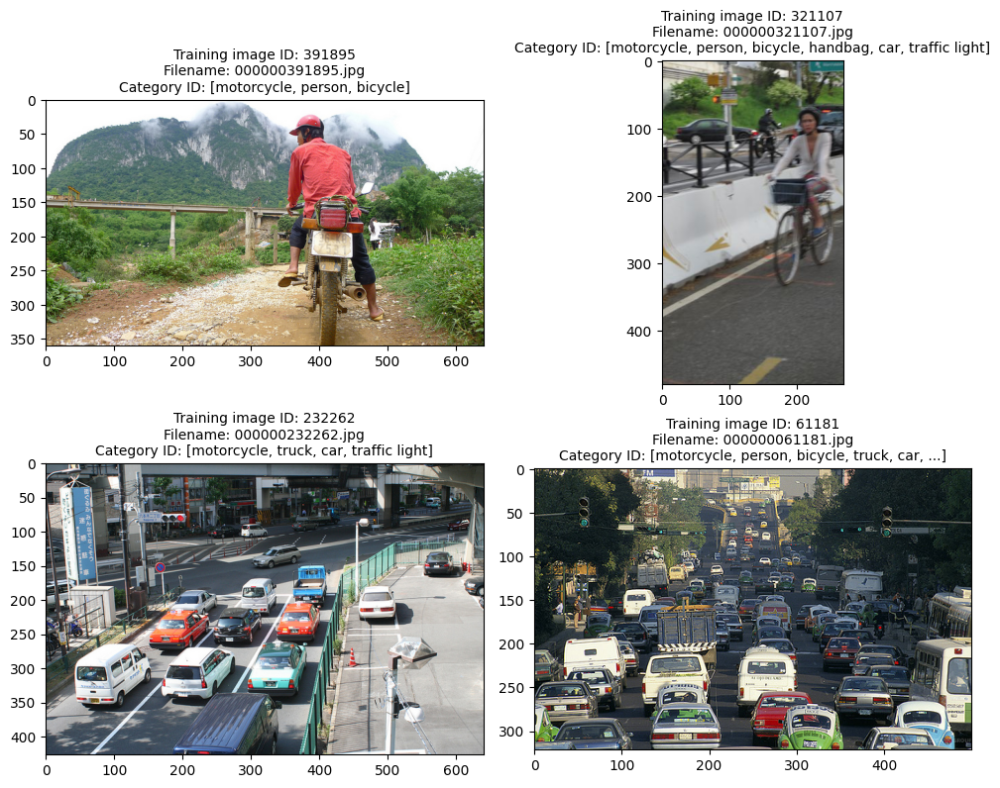

In [12]:
def show_images(data, type_set="train", index=0):
    filenames = data["file_name"].unique()[0+index*4:4+index*4]
    image_id = data["image_id"].unique()[0+index*4:4+index*4]

    fig, axs = plt.subplots(2, 2, figsize=(10, 8))
    for i, filename in enumerate(filenames):
        category_id = data.loc[data["image_id"] == image_id[i], "category_name"].unique().tolist()
        
        img = cv2.imread("/kaggle/input/coco-2017-dataset/coco2017/"+type_set+"2017/"+filename)
        
        plt.subplot(2, 2, i+1)
        plt.imshow(img[...,::-1]); # BGR -> RGB
        plt.title(f"Training image ID: {image_id[i]}\nFilename: {filename}\nCategory ID: {category_id if len(category_id) <= 6 else category_id[0:5]+['...']}".replace("'", ""), fontsize=10)
    plt.tight_layout()
    return

show_images(train, index=0)

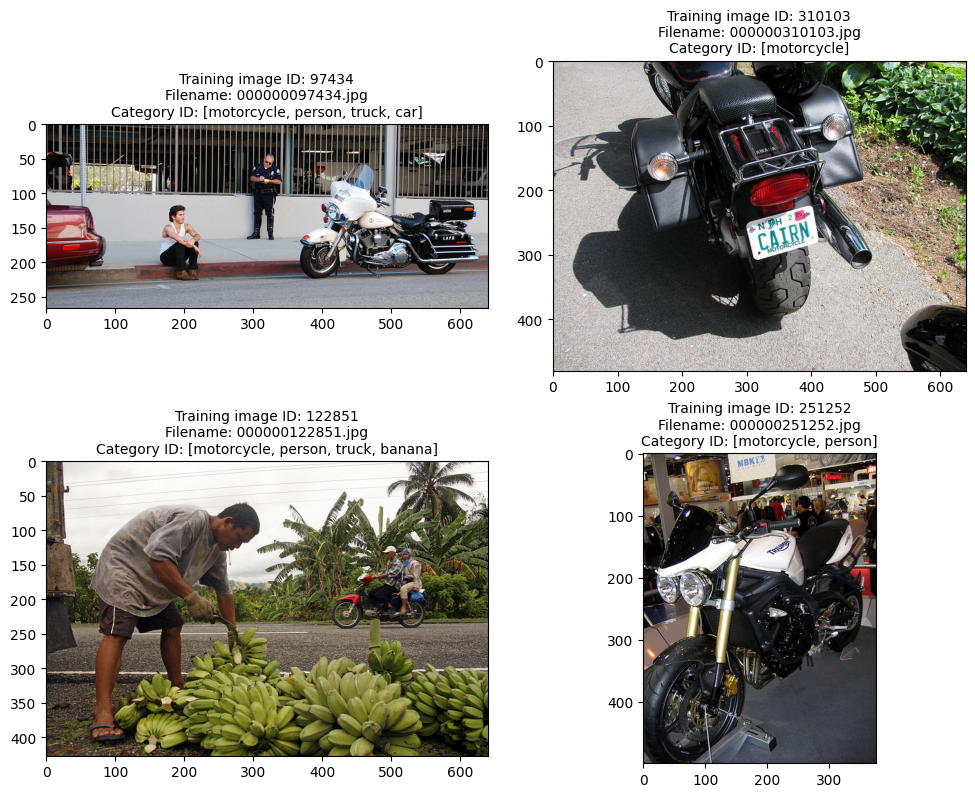

In [13]:
show_images(train, index=1)

## Set de validación

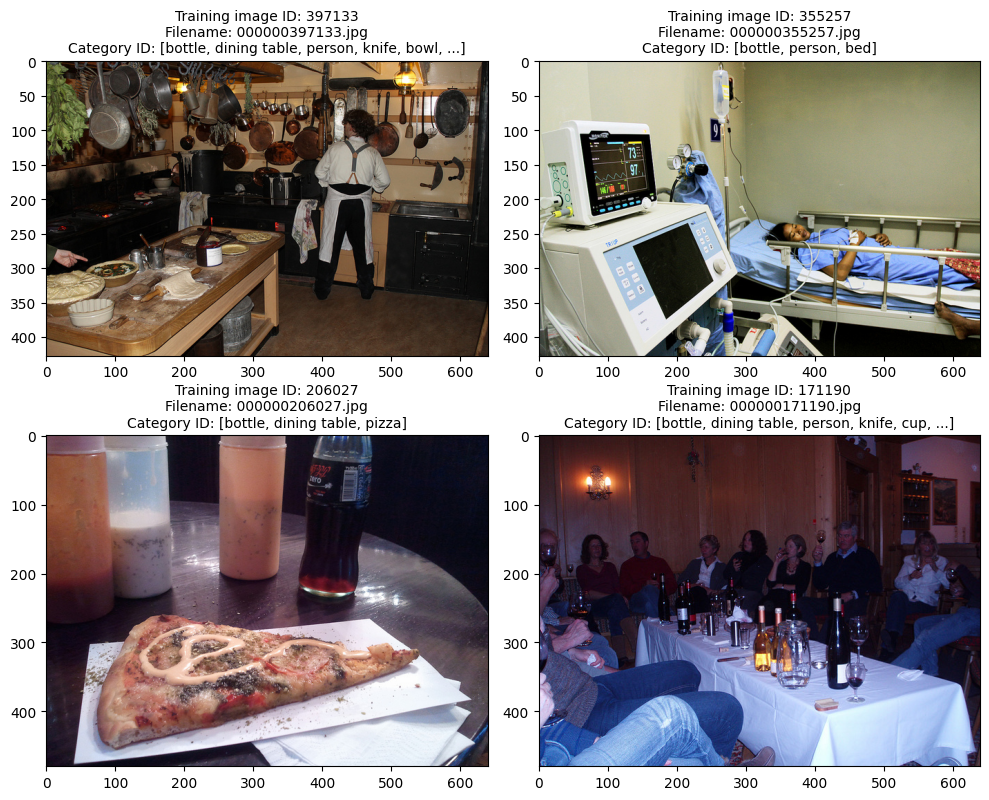

In [14]:
show_images(val, type_set="val", index=0)

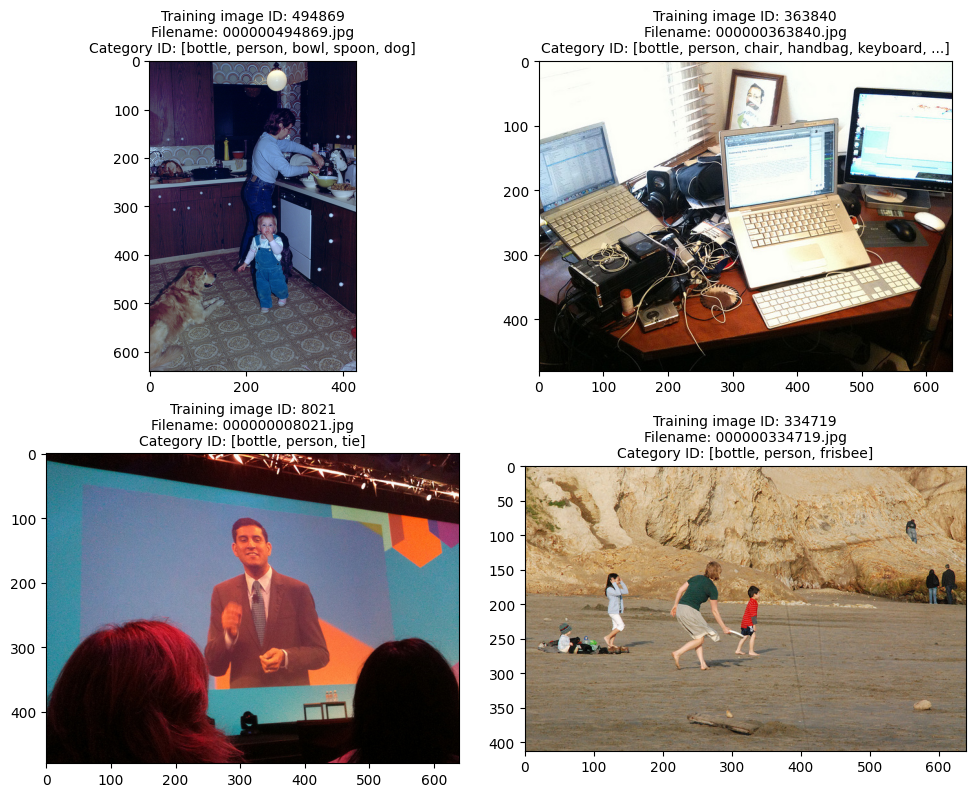

In [15]:
show_images(val, type_set="val", index=1)

## Objetivos

In [16]:
def get_data_target(df, targets, dataset="train"):
    df_target = df[df.category_name.isin(targets)].copy()
    #df_target.category_id = df_target.category_name.map(get_class_ids())
    df_target['segmentation'] = df_target['segmentation'].apply(lambda x: np.fromstring(str(x).replace('[', '').replace(']','').replace('\n', ''), dtype=float, sep=',').reshape(-1,1,2))
    df_target['bbox'] = df_target['bbox'].apply(lambda x: np.fromstring(str(x).replace('[', '').replace(']','').replace('\n', ''), dtype=float, sep=','))
    
    df_target = df_target.groupby(["file_name"]).agg({"bbox": lambda x: list(x), "segmentation": lambda x: x, "category_id": lambda x: list(x), "category_name": lambda x: list(x)}).reset_index().copy()
    
    df_target['bbox'] = df_target['bbox'].apply(lambda x: np.array(x))
    df_target['category_id'] = df_target['category_id'].apply(lambda x: np.array(x))
    df_target['segmentation'] = df_target['segmentation'].apply(lambda x: np.array(x))
    
    return df_target

targets = ['banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake']

train_target = get_data_target(train, targets)
val_target = get_data_target(val, targets, dataset="val")

train_target.head()

,file_name,bbox,segmentation,category_id,category_name
0,000000000009.jpg,"[[376.2, 40.36, 75.55, 46.53], [465.78, 38.97,...","[[[[376.2 61.55]], [[391.86 46.35]], [[424....","[55, 55, 55, 55, 56]","[orange, orange, orange, orange, broccoli]"
1,000000000092.jpg,"[[125.7, 0.96, 376.14, 292.66]]","[[[483.61, 153.53]], [[409.73, 208.22]], [[355...",[61],[cake]
2,000000000110.jpg,"[[136.66, 391.91, 337.69, 82.44]]","[[[136.66, 473.22]], [[167.15, 429.18]], [[227...",[59],[pizza]
3,000000000113.jpg,"[[142.38, 424.27, 260.32, 149.57]]","[[[176.9, 506.25]], [[152.45, 481.8]], [[142.3...",[61],[cake]
4,000000000127.jpg,"[[179.15, 263.57, 125.95, 141.15]]","[[[272.53, 402.55]], [[266.02, 384.09]], [[292...",[61],[cake]


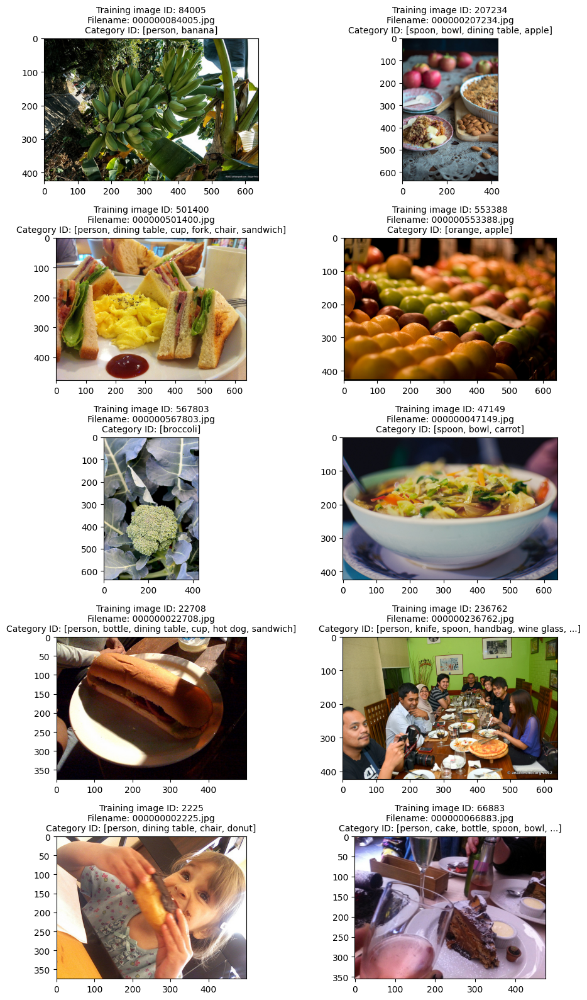

In [17]:
def show_targets(data, type_set="train", targets=[]):
    fig, axs = plt.subplots(5, 2, figsize=(10, 16))
    
    for i, target in enumerate(targets):
        target_images = data[data.category_name == target].copy()
        value = randint(0, len(target_images)-1)
        target_image = target_images.iloc[value]
        category_id = data.loc[data["image_id"] == target_image.image_id, "category_name"].unique().tolist()
        
        img = cv2.imread("/kaggle/input/coco-2017-dataset/coco2017/"+type_set+"2017/"+target_image.file_name)
        
        plt.subplot(5, 2, i+1)
        plt.imshow(img[...,::-1]); # BGR -> RGB
        plt.title(f"Training image ID: {target_image.image_id}\nFilename: {target_image.file_name}\nCategory ID: {category_id if len(category_id) <= 6 else category_id[0:5]+['...']}".replace("'", ""), fontsize=10)
    plt.tight_layout()
    return

show_targets(train, targets=targets)

## Bounding boxes

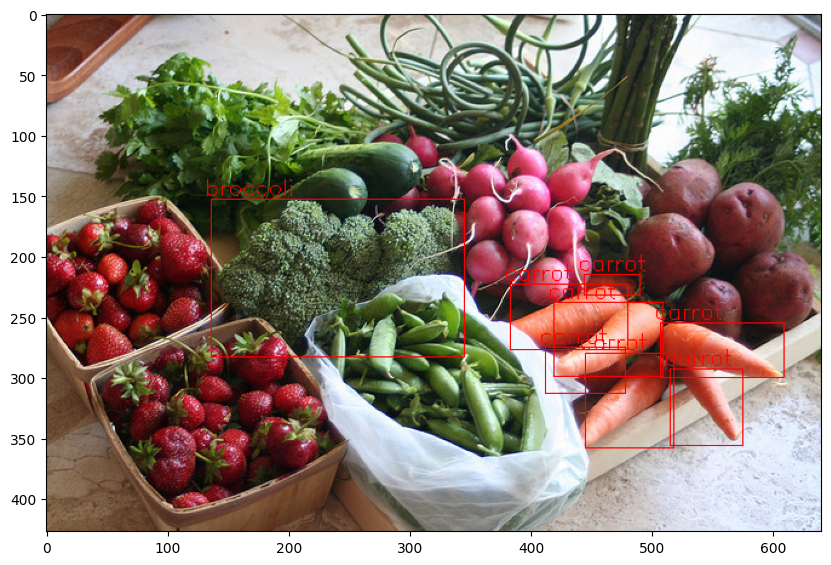

In [18]:
def add_bbox(img, bbox, category_name, fontScale=0.6):
    bbox = bbox.astype(int)
    img = cv2.rectangle(img, (bbox[0], bbox[1]), (bbox[0]+bbox[2], bbox[1]+bbox[3]), (0, 0, 255), 1)
    img = cv2.putText(img, category_name, (bbox[0]-5, bbox[1]-3), 0, fontScale, (0, 0, 255), 1)
    return img

def show_bbox(file, img=None, dataset="train"):
    if img is None:
        img = cv2.imread("/kaggle/input/coco-2017-dataset/coco2017/"+dataset+"2017/"+file.file_name)
    
    plt.figure(figsize=(10, 10))
    for bbox, category_name in zip(file.bbox, file.category_name):
        add_bbox(img, bbox, category_name)
    return img

file = train_target.iloc[1090]
img = show_bbox(file)
plt.imshow(img[...,::-1]); # BGR -> RGB

## Segmentations

<Figure size 1000x1000 with 0 Axes>

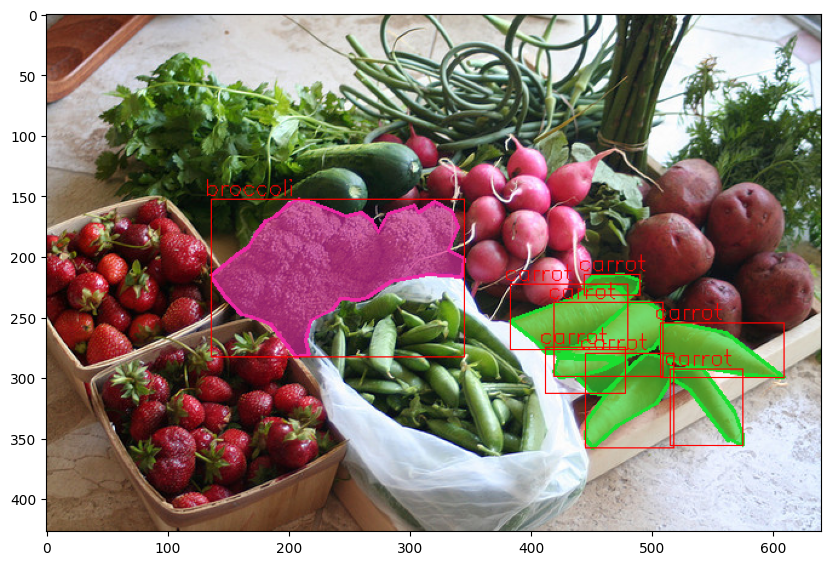

In [19]:
def get_random_color():
    h,s,l = random(), 0.5 + random()/2.0, 0.4 + random()/5.0
    return [int(256*i) for i in colorsys.hls_to_rgb(h,l,s)]

def draw_mask(file, alpha, dataset="train"):
    categories_name = list(set(file.category_name))
    colorXcategory = pd.DataFrame(data={"color":[get_random_color() for _ in range(len(categories_name))]}, index=categories_name)
    img = cv2.imread("/kaggle/input/coco-2017-dataset/coco2017/"+dataset+"2017/"+file.file_name)
    masked_image = img.copy()
    
    plt.figure(figsize=(10, 10))
    for category_name, segmentation in zip(file.category_name, file.segmentation):
        color = colorXcategory.loc[category_name, "color"]
        points = segmentation.astype(int)
        cv2.fillPoly(masked_image, [points], color=color)
        
    img = cv2.addWeighted(masked_image, alpha, img, 1 - alpha, 0) 
    
    for category_name, segmentation in zip(file.category_name, file.segmentation):
        color = colorXcategory.loc[category_name, "color"]
        points = segmentation.astype(int)
        img = cv2.polylines(img, [points], True, color=color, thickness=2)
    return img

file = train_target.iloc[1090]
img = draw_mask(file, 0.6)
img = show_bbox(file, img)
plt.imshow(img[...,::-1]); #BGR -> RGB

# Creacion del datasets de imagenes

In [20]:
import random

seed = 42
tf.random.set_seed(seed)
np.random.seed(seed)
os.environ['PYTHONHASHSEED'] = str(seed)
random.seed(seed)

img_shape = (256, 256)

autotune = tf.data.AUTOTUNE

In [21]:
def _bytes_feature(value):
    if isinstance(value, type(tf.constant(0))):
        value = value.numpy()
    return tf.train.Feature(bytes_list=tf.train.BytesList(value=[value]))

def createTFRecord(set_="train"):
    examples = []
    
    if set_ == "train":
        dataset = train_target
    elif set_ == "val":
        dataset = val_target
    
    for index, row in dataset.iterrows():
        with open("/kaggle/input/coco-2017-dataset/coco2017/"+set_+"2017/"+row.file_name,'rb') as f:
            image_data=f.read()

        example = tf.train.Example(features=tf.train.Features(feature={
            'image': tf.train.Feature(bytes_list=tf.train.BytesList(value=[image_data])),
            'file_name': tf.train.Feature(bytes_list=tf.train.BytesList(value=[tf.compat.as_bytes(row.file_name)])),
            'category_ids': tf.train.Feature(int64_list=tf.train.Int64List(value=row.category_id)),
            'bboxes': _bytes_feature(tf.io.serialize_tensor(row.bbox)),
        }))
        examples.append(example)
        
    with tf.io.TFRecordWriter("/kaggle/working/coco_"+set_+".tfrecord") as writer:
        for j in examples:
            writer.write(j.SerializeToString())
    examples.clear()
    return 

def parse(feature):
    features = tf.io.parse_single_example(
        feature,
        features={
        'image': tf.io.FixedLenFeature([], tf.string),
        'file_name': tf.io.FixedLenFeature([], tf.string),
        'category_ids': tf.io.VarLenFeature(tf.int64),
        'bboxes': tf.io.FixedLenFeature([], tf.string)
        
    })
    return tf.image.decode_jpeg(features['image'], channels=3), tf.io.parse_tensor(features['bboxes'], out_type=tf.float64), tf.sparse.to_dense(features["category_ids"]) 

if create_tensorflor_record == True:
    createTFRecord("train")
    createTFRecord("val")

train_dataset = tf.data.TFRecordDataset("/kaggle/working/coco_train.tfrecord")
train_dataset = train_dataset.map(parse, num_parallel_calls=autotune)

val_dataset = tf.data.TFRecordDataset("/kaggle/working/coco_val.tfrecord")
val_dataset = val_dataset.map(parse, num_parallel_calls=autotune)

------------------------

# Clasificador

## Redimensionando imagenes manteniendo la relación de aspecto con padding zero

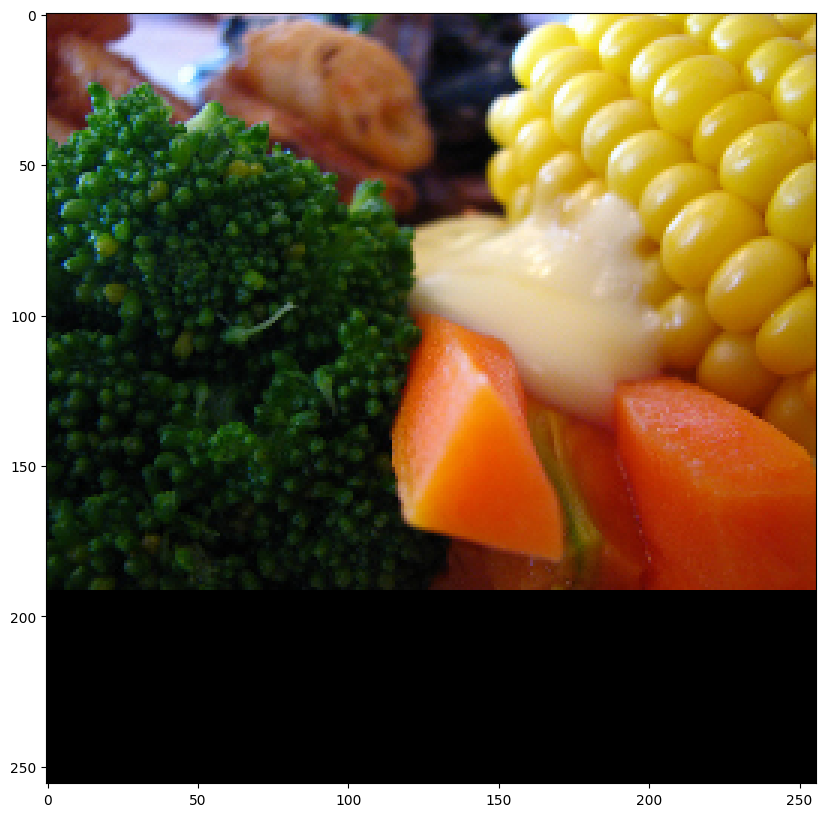

In [22]:
def image_to_tensor(path):
    return tf.convert_to_tensor(cv2.imread(path)/255)

def padding_zero_clf(image):
    max_side = tf.reduce_max(tf.shape(image)[:2])
    image_ = tf.image.pad_to_bounding_box(image, 0, 0, max_side, max_side)
    return image_

def resize_clf(image, w, h):
    image_ = tf.image.resize(image, [w, h])
    return image_

def preprocess_image_clf(image_data, w, h):
    image_data = padding_zero_clf(image_data)
    image_data = resize_clf(image_data, w, h)
    return tf.convert_to_tensor(image_data, dtype=tf.float32)

file = train_target.iloc[260]
img_t = image_to_tensor("/kaggle/input/coco-2017-dataset/coco2017/train2017/"+file.file_name)
img_t = preprocess_image_clf(img_t, w=img_shape[0], h=img_shape[1])

plt.figure(figsize=(10, 10))
plt.imshow(img_t[...,::-1]);

## Pre-procesando el set de imagenes

In [23]:
def get_class_ids(category_id=None):
    dict_class = {target:i for i, target in enumerate(targets)}
    if category_id is None:
        return dict_class
    else:
        return dict_class[train_cat.loc[train_cat.id == category_id, "name"].values[0]]

def my_func(class_ids):
    return np.array([get_class_ids(category_id=id_) for id_ in class_ids], dtype="int32")

def my_numpy_func(class_ids):
    func = tf.numpy_function(my_func, [class_ids], [tf.int32])
    return func

def preprocess_data_clf(image_data, bbox, class_ids):
    image_data = preprocess_image_clf(image_data, w=img_shape[0], h=img_shape[1])
    image_data = tf.keras.applications.resnet50.preprocess_input(image_data)
    class_ids_ = my_numpy_func(class_ids)
    class_ids_ = tf.reduce_max(tf.one_hot(class_ids_[0], depth=num_classes), axis=0)
    class_ids_ = tf.reshape(class_ids_, [num_classes])
    return tf.cast(image_data, dtype="float32"), tf.cast(class_ids_, dtype="int8")

batch_size = 16
num_classes = 10

train_dataset_clf = train_dataset.map(preprocess_data_clf, num_parallel_calls=autotune)
#train_dataset_clf = train_dataset_clf.shuffle(8 * batch_size)
train_dataset_clf = train_dataset_clf.batch(batch_size)
train_dataset_clf = train_dataset_clf.prefetch(autotune)

val_dataset_clf = train_dataset.map(preprocess_data_clf, num_parallel_calls=autotune)
val_dataset_clf = val_dataset_clf.batch(batch_size)
val_dataset_clf = val_dataset_clf.prefetch(autotune)

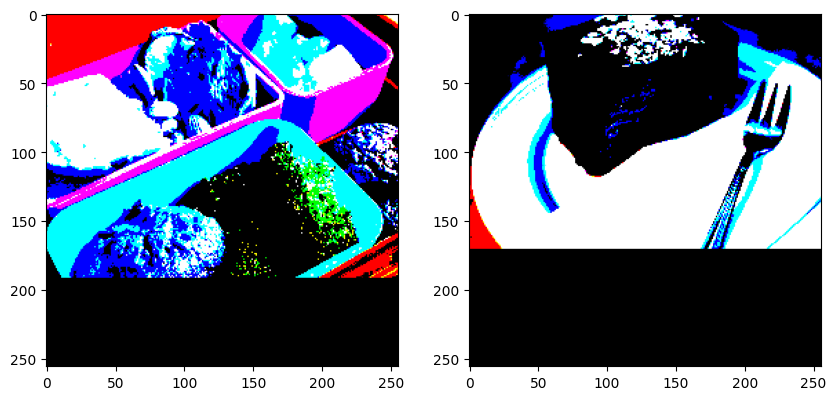

In [24]:
fig, axs = plt.subplots(1, 2, figsize=(10, 8))
for i, data in enumerate(train_dataset_clf.take(1).unbatch()):
    plt.subplot(1, 2, i+1)
    plt.imshow(data[0]);
    if i == 1:
        break

## Arquitectura del clasificador de imagenes multi-label


In [25]:
backbone_clf = ResNet50(input_shape=(None, None, 3), include_top=False)
backbone_clf.trainable = False

model_clf = tf.keras.Sequential(layers=[
    Input(shape=(None, None, 3)),
    tf.keras.layers.RandomFlip("horizontal"),
    tf.keras.layers.RandomRotation(0.25),
    tf.keras.layers.RandomZoom(0.05, 0.05),

    backbone_clf,

    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dense(1024, activation="relu"),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(256, activation="relu"),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(64, activation="relu"),
    tf.keras.layers.Dense(num_classes, activation="sigmoid")
])

model_clf.compile(loss=tf.keras.losses.BinaryCrossentropy(),
               optimizer=tf.keras.optimizers.Adam(),
               metrics=["accuracy"])

94765736/94765736 [==============================] - 5s 0us/step


### Buscando el learning rate optimo

In [26]:
epochs = 6
lr_scheduler = tf.keras.callbacks.LearningRateScheduler(lambda epoch: 1e-4 * 10**(epoch/5))

history_clf = model_clf.fit(train_dataset_clf,
                     epochs=epochs,
                     callbacks=[lr_scheduler],
                     verbose=1)

Epoch 1/6
1016/1016 [==============================] - 78s 66ms/step - loss: 0.3289 - accuracy: 0.3610 - lr: 1.0000e-04
Epoch 2/6
1016/1016 [==============================] - 67s 66ms/step - loss: 0.2669 - accuracy: 0.4885 - lr: 1.5849e-04
Epoch 3/6
1016/1016 [==============================] - 67s 65ms/step - loss: 0.2515 - accuracy: 0.5227 - lr: 2.5119e-04
Epoch 4/6
1016/1016 [==============================] - 66s 65ms/step - loss: 0.2462 - accuracy: 0.5352 - lr: 3.9811e-04
Epoch 5/6
1016/1016 [==============================] - 67s 66ms/step - loss: 0.2487 - accuracy: 0.5301 - lr: 6.3096e-04
Epoch 6/6
1016/1016 [==============================] - 67s 66ms/step - loss: 0.2527 - accuracy: 0.5256 - lr: 0.0010


Text(0, 0.5, 'Loss')

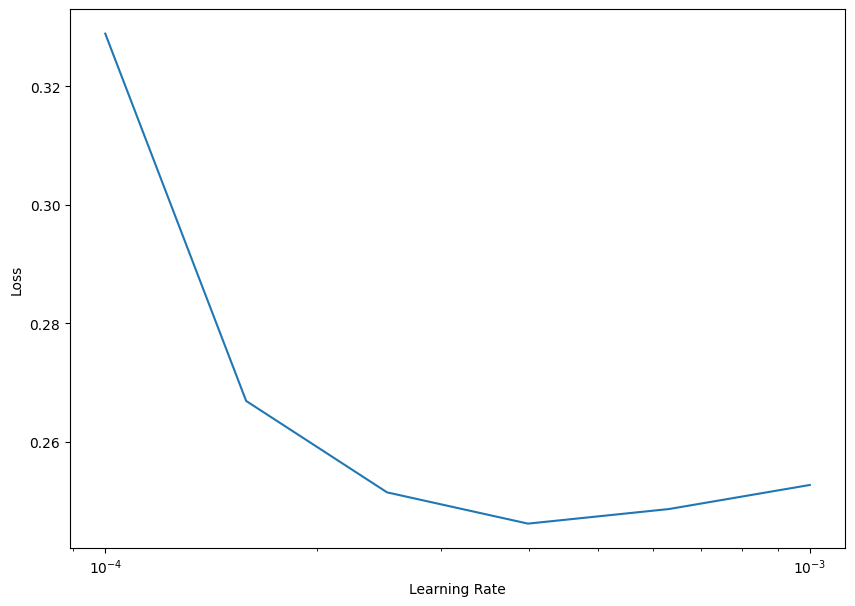

In [27]:
lrs = 1e-4 * (10**(np.arange(epochs)/5))
plt.figure(figsize=(10,7))
plt.semilogx(lrs, history_clf.history['loss'])
plt.xlabel('Learning Rate')
plt.ylabel('Loss')

In [28]:
minimum = min(history_clf.history['loss'])
index = history_clf.history['loss'].index(minimum)
lr = lrs[index]
print("El mejor learning rate es", lr)

El mejor learning rate es 0.0003981071705534973


### Guardado de checkpoints de aprendizaje

In [29]:
model_dir = '/kaggle/working/clasificador/'

callbacks_list = [
    tf.keras.callbacks.ModelCheckpoint(
        filepath=os.path.join(model_dir, "weights" + "_epoch_{epoch}"),
        monitor="loss",
        save_best_only=False,
        save_weights_only=True,
        verbose=1,
    )
]

### Entrenamiento del modelo

In [30]:
backbone_clf = ResNet50(input_shape=(None, None, 3), include_top=False)
backbone_clf.trainable = False

model_clf = tf.keras.Sequential(layers=[
    Input(shape=(None, None, 3)),
    tf.keras.layers.RandomFlip("horizontal"),
    tf.keras.layers.RandomRotation(0.25),
    tf.keras.layers.RandomZoom(0.05, 0.05),

    backbone_clf,
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dense(256, activation="relu"),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(64, activation="relu"),
    tf.keras.layers.Dense(num_classes, activation="softmax")
])

model_clf.compile(loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
             optimizer=tf.keras.optimizers.Adam(lr=5e-4),
             metrics=["accuracy"])

#Para cargar viejos weights
if os.path.isdir(model_dir) and len(os.listdir(model_dir)) > 1: 
    latest_checkpoint = tf.train.latest_checkpoint(model_dir)
    model_clf.load_weights(latest_checkpoint)

epochs = 10
history_clf2 = model_clf.fit(
                        train_dataset_clf,
                        validation_data=val_dataset_clf,
                        epochs=epochs,
                        #callbacks=callbacks_list,
                        verbose=1
                )

Epoch 1/10


/opt/conda/lib/python3.10/site-packages/keras/src/backend.py:5805: UserWarning: "`binary_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Sigmoid activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


1016/1016 [==============================] - 136s 129ms/step - loss: 0.2876 - accuracy: 0.4529 - val_loss: 0.2151 - val_accuracy: 0.6039
Epoch 2/10
1016/1016 [==============================] - 130s 128ms/step - loss: 0.2530 - accuracy: 0.5150 - val_loss: 0.2030 - val_accuracy: 0.6101
Epoch 3/10
1016/1016 [==============================] - 131s 129ms/step - loss: 0.2419 - accuracy: 0.5401 - val_loss: 0.1960 - val_accuracy: 0.6286
Epoch 4/10
1016/1016 [==============================] - 130s 128ms/step - loss: 0.2353 - accuracy: 0.5534 - val_loss: 0.1929 - val_accuracy: 0.6378
Epoch 5/10
1016/1016 [==============================] - 130s 128ms/step - loss: 0.2296 - accuracy: 0.5634 - val_loss: 0.1910 - val_accuracy: 0.6416
Epoch 6/10
1016/1016 [==============================] - 127s 125ms/step - loss: 0.2267 - accuracy: 0.5723 - val_loss: 0.1878 - val_accuracy: 0.6503
Epoch 7/10
1016/1016 [==============================] - 129s 127ms/step - loss: 0.2233 - accuracy: 0.5712 - val_loss: 0.186

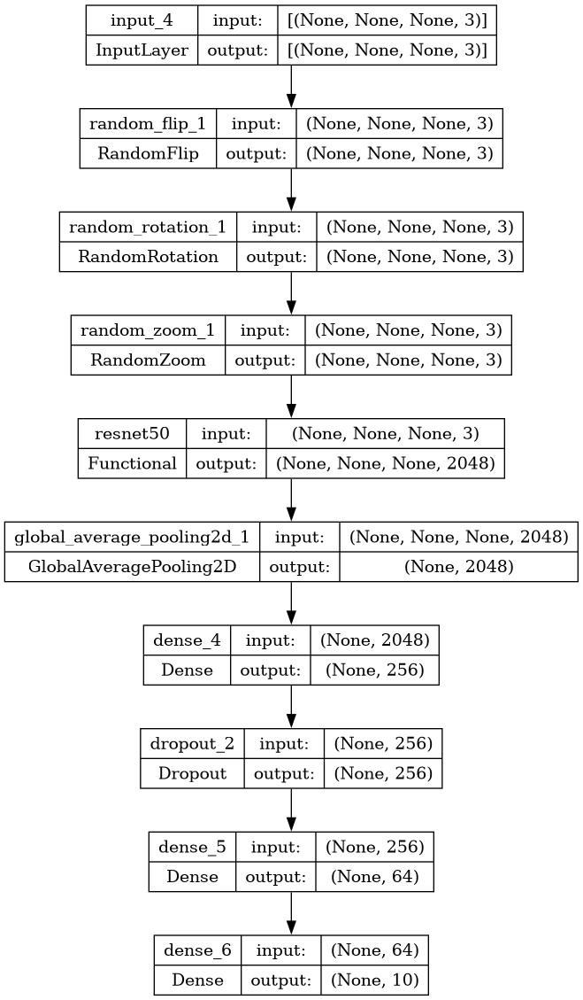

In [31]:
plot_model(model_clf, show_shapes=True)

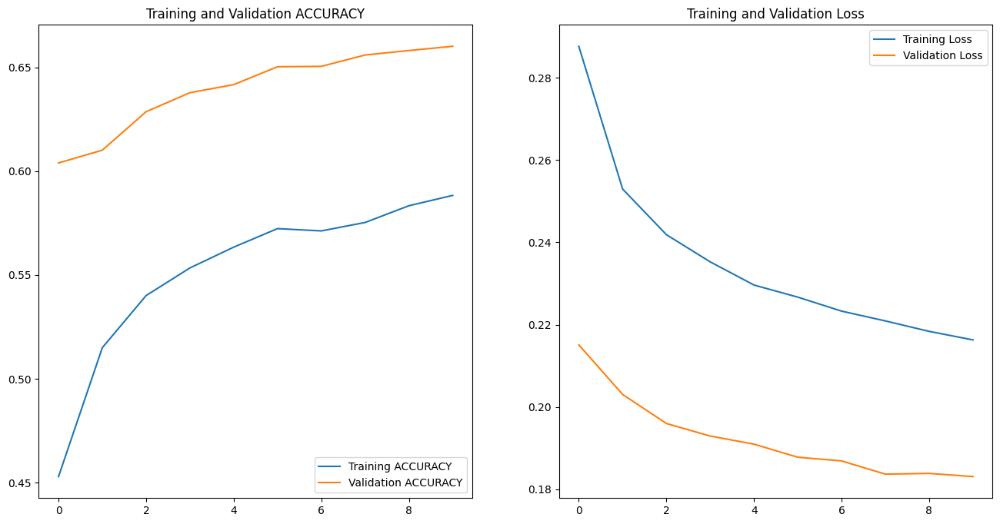

In [32]:
def plot_history(history, epochs, metric="accuracy"):
    acc = history.history[metric]
    val_acc = history.history['val_'+metric]

    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs_range = range(epochs)

    plt.figure(figsize=(16, 8))
    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, acc, label='Training '+metric.upper())
    plt.plot(epochs_range, val_acc, label='Validation '+metric.upper())
    plt.legend(loc='lower right')
    plt.title('Training and Validation '+metric.upper())

    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, loss, label='Training Loss')
    plt.plot(epochs_range, val_loss, label='Validation Loss')
    plt.legend(loc='upper right')
    plt.title('Training and Validation Loss')
    plt.show()
    
plot_history(history_clf2, epochs, metric="accuracy")

1/1 [==============================] - 0s 22ms/step


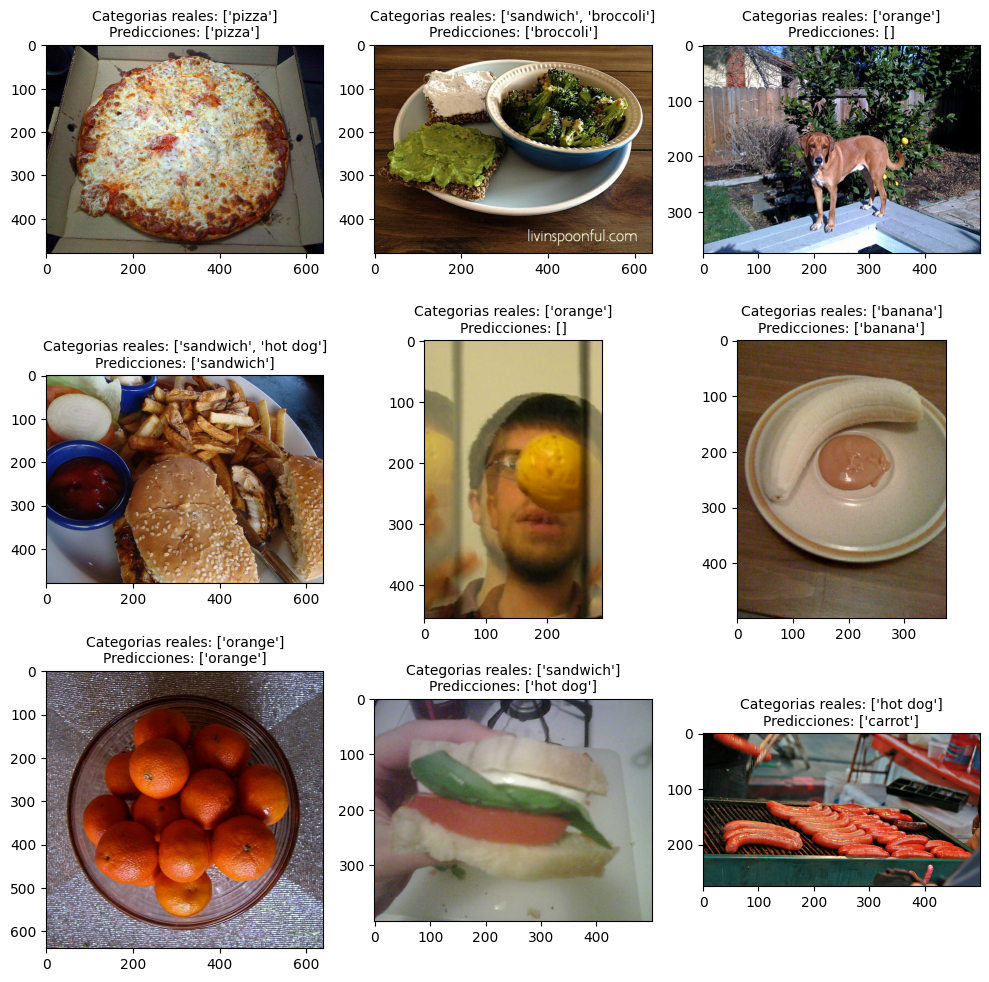

In [33]:
fig, axs = plt.subplots(3, 3, figsize=(10, 10))

for i, data in enumerate(val_dataset.shuffle(100).take(9)):
    img_pre = preprocess_image_clf(data[0], w=img_shape[0], h=img_shape[1])
    img_pre = tf.keras.applications.resnet50.preprocess_input(img_pre)
    
    predict = model_clf.predict(tf.expand_dims(img_pre, axis=0))
    predict_bool = (predict[0] > .5)
    class_ids = list(get_class_ids().keys())
    classes = []
    classes_reales = []
    
    for k, x in enumerate(predict_bool):
        if bool(x) is True:
            classes.append(class_ids[k])
            
    for x in data[2].numpy():
            classes_reales.append(class_ids[get_class_ids(x)])
    
    plt.subplot(3, 3, i+1)
    plt.imshow(data[0])
    plt.title(f"Categorias reales: {list(set(classes_reales))}\nPredicciones: {classes}", fontsize=10)
plt.tight_layout()

1/1 [==============================] - 0s 22ms/step


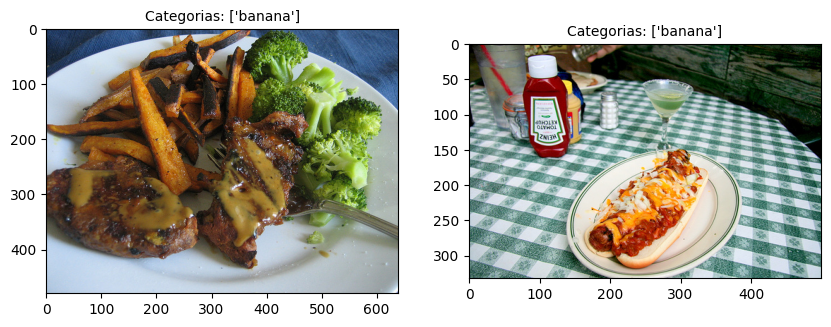

In [34]:
test_file = ["/kaggle/input/coco-2017-dataset/coco2017/test2017/000000000161.jpg","/kaggle/input/coco-2017-dataset/coco2017/test2017/000000000183.jpg"]

fig, axs = plt.subplots(1, 2, figsize=(10, 8))

for i, pathfile in enumerate(test_file):
    img = image_to_tensor(pathfile)
    img_pre = preprocess_image_clf(img, w=img_shape[0], h=img_shape[1])
    img_pre = tf.keras.applications.resnet50.preprocess_input(img_pre)
    
    predict = model_clf.predict(tf.expand_dims(img_pre, axis=0))
    predict_bool = (predict[0] > .5)
    class_ids = list(get_class_ids().keys())
    classes = []
    
    for k, x in enumerate(predict_bool):
        if bool(x) is True:
            classes.append(class_ids[k])
    
    plt.subplot(1, 2, i+1)
    plt.imshow(img[...,::-1])
    plt.title(f"Categorias: {classes}", fontsize=10)

In [35]:
#import shutil
#shutil.rmtree("/kaggle/working/clasificador") #folders with files

------------------------------------

# Localizador
## Redimensionando imagenes y bounding boxes manteniendo la relación de aspecto

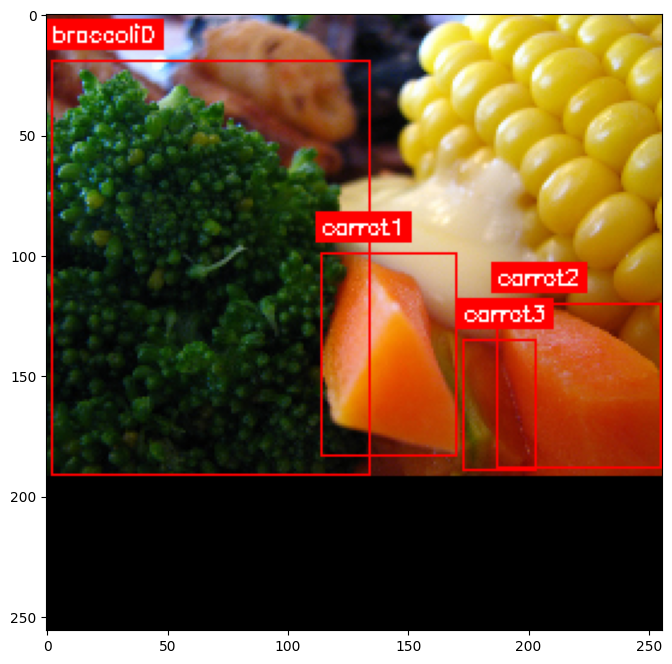

In [36]:
def center_xywh(boxes):
    return tf.concat([boxes[..., :2] + (boxes[..., 2:] / 2.0), boxes[..., 2:]], axis=-1)

def add_bbox(img, bbox, category_name=None, fontScale=0.6, color=(0, 0, 255), lw=1):
    bbox_ = bbox.astype(int)
    x1y1 = (bbox_[0]-(bbox_[2]//2), bbox_[1]-(bbox_[3]//2))
    x2y2 = (bbox_[0]+(bbox_[2]//2), bbox_[1]+(bbox_[3]//2))
    img_ = cv2.rectangle(img, x1y1, x2y2, color, lw)
    if category_name is not None:
        labelSize, baseLine = cv2.getTextSize(category_name, cv2.FONT_HERSHEY_SIMPLEX, fontScale, 1)
        img = cv2.rectangle(img, (x1y1[0]-2, x1y1[1] - labelSize[1] - 10),(x1y1[0] + labelSize[0]+2, x1y1[1] + baseLine - 8), color, cv2.FILLED)
        img = cv2.putText(img, category_name, (x1y1[0], x1y1[1] - 8), cv2.FONT_HERSHEY_SIMPLEX, fontScale, (255, 255, 255))
    return img_

def resize_loc(image, w, h, bbox=None):
    image_shape = tf.cast(tf.shape(image)[:2], dtype=tf.float32)
    max_side = tf.reduce_max(image_shape)
    ratio = tf.cast(tf.reduce_max([w, h]), dtype=tf.float32) / max_side
    image_shape = image_shape * ratio
    image_ = tf.image.resize(image, tf.cast(tf.math.ceil(image_shape), dtype=tf.int32))
    
    if bbox is not None:
        original_image_shape = tf.cast(tf.shape(image)[:2], dtype=tf.float32)
        
        x_scale = image_shape[1] / original_image_shape[1]
        y_scale = image_shape[0] / original_image_shape[0]
        
        x_scale = tf.cast(x_scale, dtype=tf.float32)
        y_scale = tf.cast(y_scale, dtype=tf.float32)
        bbox = tf.cast(bbox ,dtype=tf.float32)
        
        bbox = tf.stack(
            [
                tf.math.multiply(bbox[..., 0], x_scale),
                tf.math.multiply(bbox[..., 1], y_scale),
                tf.math.multiply(bbox[..., 2], x_scale),
                tf.math.multiply(bbox[..., 3], y_scale),
            ],
            axis=-1,
        )
        bbox = center_xywh(bbox)
    return image_, bbox

def preprocess_image_loc(image_data, w, h, bbox):
    image_data_, bbox = resize_loc(image_data, w, h, bbox)
    image_data_ = padding_zero_clf(image_data_)
    return tf.convert_to_tensor(image_data_, dtype=tf.float32), tf.cast(bbox, dtype=tf.float32)

file = train_target.iloc[260]
img_t = image_to_tensor("/kaggle/input/coco-2017-dataset/coco2017/train2017/"+file.file_name)
img_t, bboxs = preprocess_image_loc(img_t, w=img_shape[0], h=img_shape[1], bbox=tf.convert_to_tensor(file.bbox))
img_t_npy = img_t.numpy()

i=0
for bbox, category_name in zip(bboxs, file.category_name):
    img_t_npy = add_bbox(img_t_npy, bbox.numpy(), category_name+str(i), fontScale=0.3, lw=1)
    i += 1

plt.figure(figsize=(10, 8))
plt.imshow(img_t_npy[...,::-1]);

## Pre-procesando el set de imagenes

In [37]:
def bbox2corner(boxes):
    return tf.concat([boxes[..., :2] - (boxes[..., 2:] / 2.0), boxes[..., :2] + (boxes[..., 2:] / 2.0)], axis=-1)

def normalized_bbox(image_shape, bboxs):
    image_shape = tf.cast(image_shape, dtype=tf.float32)
    return tf.stack([bboxs[..., 0] / image_shape[1], bboxs[..., 1] / image_shape[0], bboxs[..., 2] / image_shape[1], bboxs[..., 3] / image_shape[0]], axis=-1)
    
def preprocess_data_loc(image_data, bbox, class_ids):
    image_data_, bboxs = preprocess_image_loc(image_data, w=img_shape[0], h=img_shape[1], bbox=bbox)
    image_data_ = tf.keras.applications.resnet50.preprocess_input(image_data_)
    
    bboxs = normalized_bbox(tf.shape(image_data_)[:2], tf.cast(bbox2corner(bboxs), dtype=tf.float32))

    return tf.cast(image_data_, dtype=tf.float32), bboxs[0]

batch_size = 16

train_dataset_loc = train_dataset.map(preprocess_data_loc, num_parallel_calls=autotune)
train_dataset_loc = train_dataset_loc.batch(batch_size)
train_dataset_loc = train_dataset_loc.prefetch(autotune)

val_dataset_loc = val_dataset.map(preprocess_data_loc, num_parallel_calls=autotune)
val_dataset_loc = val_dataset_loc.batch(batch_size)
val_dataset_loc = val_dataset_loc.prefetch(autotune)

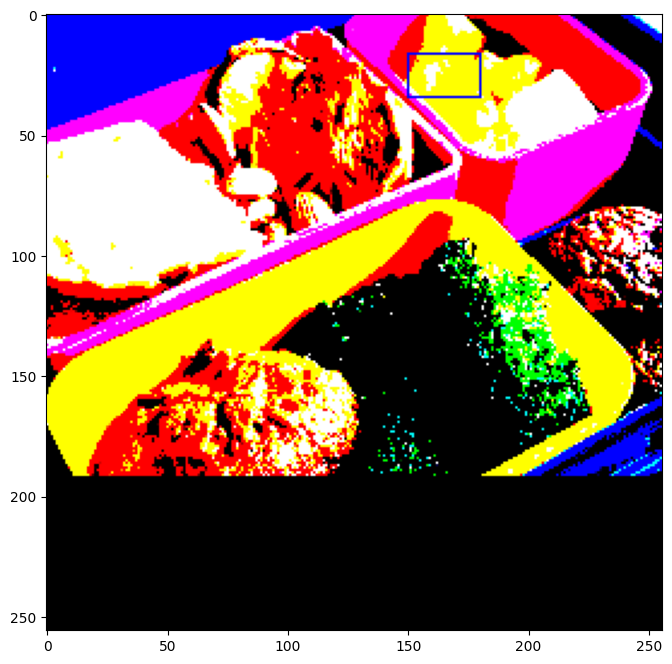

In [38]:
for data in train_dataset_loc.take(1).unbatch():
    bbox = data[1].numpy()
    bbox = np.array([bbox[0] + (bbox[2] - bbox[0])/2, bbox[1] + (bbox[3] - bbox[1])/2, bbox[2] - bbox[0], bbox[3] - bbox[1]])*img_shape[0]
    img = add_bbox(data[0].numpy(), bbox, color=(255, 0, 0))
    plt.figure(figsize=(10, 8))
    plt.imshow(img[...,::-1]);
    break

In [39]:
model_dir = '/kaggle/working/localizador/'

callbacks_list = [
    tf.keras.callbacks.ModelCheckpoint(
        filepath=os.path.join(model_dir, "weights" + "_epoch_{epoch}"),
        monitor="loss",
        save_best_only=False,
        save_weights_only=True,
        verbose=1,
    )
]

In [40]:
backbone_loc = ResNet50(input_shape=(None, None, 3), include_top=False)
backbone_loc.trainable = False

model_loc = tf.keras.Sequential(layers=[
    Input(shape=(None, None, 3)),
    tf.keras.layers.Rescaling(scale=1./127.5, offset=-1),

    backbone_loc,

    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dense(1024, activation="relu"),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(256, activation="relu"),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(64, activation="relu"),
    tf.keras.layers.Dense(4, activation="linear")
])

model_loc.compile(loss=tf.keras.losses.MeanSquaredError(),
                optimizer=tf.keras.optimizers.Adam(lr=5e-4),
                metrics=["mae", tfa.losses.GIoULoss()])

#Para cargar viejos weights
if os.path.isdir(model_dir) and len(os.listdir(model_dir)) > 1: 
    latest_checkpoint = tf.train.latest_checkpoint(model_dir)
    model_loc.load_weights(latest_checkpoint)

epochs = 10
history_loc = model_loc.fit(
                        train_dataset_loc,
                        validation_data=val_dataset_loc,
                        epochs=epochs,
                        #callbacks=callbacks_list,
                        verbose=1)

Epoch 1/10
1016/1016 [==============================] - 58s 52ms/step - loss: 0.0602 - mae: 0.1911 - giou_loss: 1.1444 - val_loss: 0.0400 - val_mae: 0.1636 - val_giou_loss: 1.0735
Epoch 2/10
1016/1016 [==============================] - 52s 51ms/step - loss: 0.0414 - mae: 0.1659 - giou_loss: 1.0566 - val_loss: 0.0388 - val_mae: 0.1608 - val_giou_loss: 1.0680
Epoch 3/10
1016/1016 [==============================] - 50s 49ms/step - loss: 0.0409 - mae: 0.1647 - giou_loss: 1.0522 - val_loss: 0.0391 - val_mae: 0.1615 - val_giou_loss: 1.0761
Epoch 4/10
1016/1016 [==============================] - 51s 50ms/step - loss: 0.0404 - mae: 0.1635 - giou_loss: 1.0487 - val_loss: 0.0380 - val_mae: 0.1584 - val_giou_loss: 1.0498
Epoch 5/10
1016/1016 [==============================] - 50s 49ms/step - loss: 0.0398 - mae: 0.1624 - giou_loss: 1.0455 - val_loss: 0.0381 - val_mae: 0.1590 - val_giou_loss: 1.0569
Epoch 6/10
1016/1016 [==============================] - 52s 51ms/step - loss: 0.0398 - mae: 0.1622 -

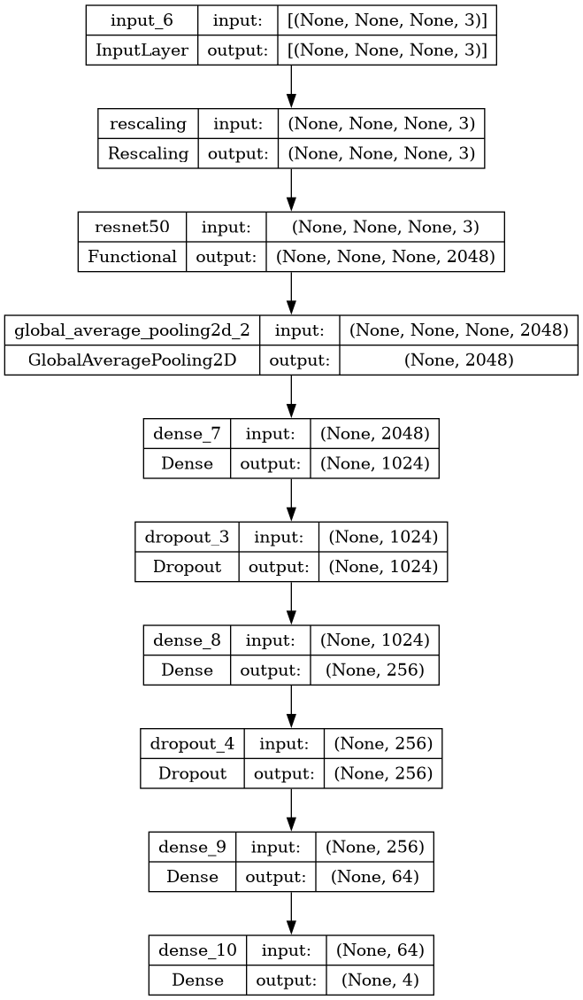

In [41]:
plot_model(model_loc, show_shapes=True)

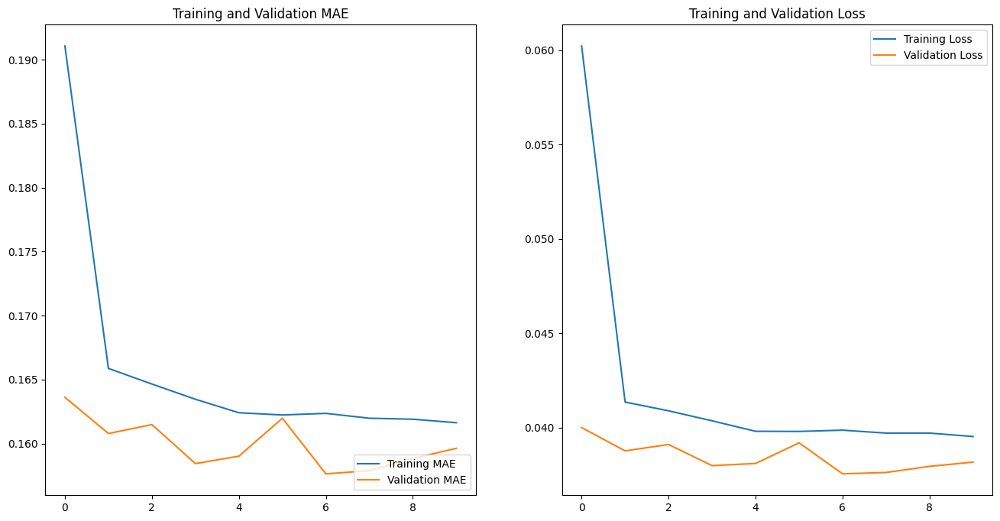

In [42]:
plot_history(history_loc, epochs, metric="mae")

1/1 [==============================] - 0s 22ms/step


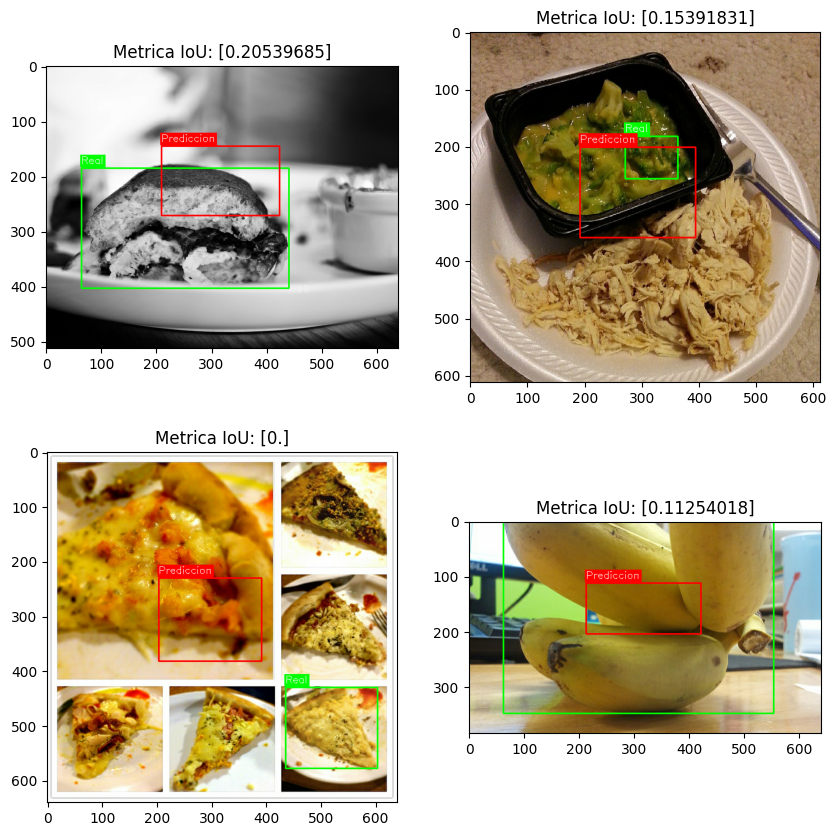

In [43]:
def metric_iou(boxesA, boxesB):
    boxesA_, boxesB_ = tf.cast(tf.expand_dims(boxesA, axis=0), dtype=tf.float32), tf.cast(tf.expand_dims(boxesB, axis=0), dtype=tf.float32)
    boxesA_ = bbox2corner(boxesA_)
    boxesB_ = bbox2corner(boxesB_)
    
    left_upper = tf.maximum(boxesA_[..., None, :2], boxesB_[..., :2])
    right_down = tf.minimum(boxesA_[..., None, 2:], boxesB_[..., 2:])
    
    intersection = tf.maximum(0.0, right_down - left_upper)
    intersection_area = intersection[:, :, 0] * intersection[:, :, 1]
    
    boxesA_area = (boxesA_[..., 2] - boxesA_[..., 0]) * (boxesA_[..., 3] - boxesA_[..., 1])
    boxesB_area = (boxesB_[..., 2] - boxesB_[..., 0]) * (boxesB_[..., 3] - boxesB_[..., 1])
    
    union_area = tf.maximum(boxesA_area[:, None] + boxesB_area - intersection_area, 1e-8)
    return tf.clip_by_value(intersection_area / union_area, 0.0, 1.0)

fig, axs = plt.subplots(2, 2, figsize=(10, 10))

for i, data in enumerate(val_dataset.shuffle(10).take(4)):
    bbox = center_xywh(data[1]).numpy()[0]
    img_pre = preprocess_image_clf(data[0], w=img_shape[0], h=img_shape[1])
    img_pre = tf.keras.applications.resnet50.preprocess_input(img_pre)
    image_shape = tf.shape(data[0]).numpy()
    predict_bbox = model_loc.predict(tf.expand_dims(img_pre, axis=0))[0]
    predict_bbox = np.array([predict_bbox[0] + (predict_bbox[2] - predict_bbox[0])/2, predict_bbox[1] + (predict_bbox[3] - predict_bbox[1])/2, predict_bbox[2] - predict_bbox[0], predict_bbox[3] - predict_bbox[1]])
    predict_bbox = np.array([predict_bbox[0] * image_shape[1], predict_bbox[1] * image_shape[0], predict_bbox[2] * image_shape[1], predict_bbox[3] * image_shape[0]])
    
    iou_value = metric_iou(predict_bbox, bbox)
    
    img = add_bbox(data[0].numpy(), bbox, category_name="Real", color=(0, 255, 0), lw=2)
    img = add_bbox(img, predict_bbox, category_name="Prediccion", color=(255, 0, 0), lw=2)
    plt.subplot(2, 2, i+1)
    plt.imshow(img)
    plt.title(f"Metrica IoU: {iou_value.numpy()[0]}")

----------------------------------

# Clasificador y localizador
## Redimensionamiento variable de imagenes y bounding boxes manteniendo la relación de aspecto

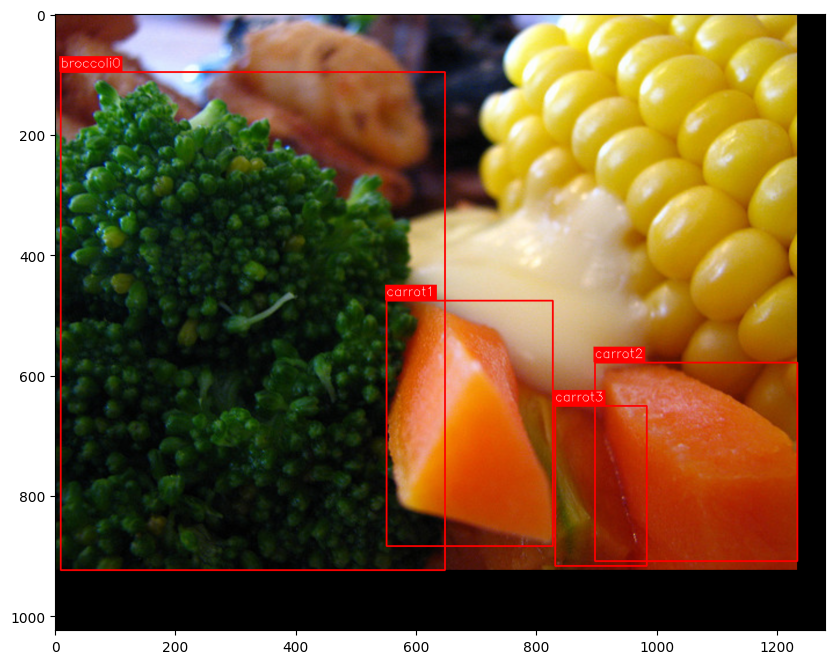

In [44]:
def padding_zero(image, stride=128.0):
    image_shape = tf.cast(tf.shape(image)[-3:-1], dtype=tf.float32)
    padded_image_shape = tf.cast(tf.math.ceil(image_shape / stride) * stride, dtype=tf.int32)
    image_ = tf.image.pad_to_bounding_box(image, 0, 0, padded_image_shape[0], padded_image_shape[1])
    return image_

def resize(image, bbox=None, stride=128.0, min_side=800.0, max_side=1333.0, jitter=[640, 1024]):
    image_shape = tf.cast(tf.shape(image)[:2], dtype=tf.float32)
    
    if jitter is not None:
        min_side = tf.random.uniform((), jitter[0], jitter[1], dtype=tf.float32)
    ratio = min_side / tf.reduce_min(image_shape)
    
    if ratio * tf.reduce_max(image_shape) > max_side:
        ratio = max_side / tf.reduce_max(image_shape)
    image_shape = ratio * image_shape
    
    image_ = tf.image.resize(image, tf.cast(image_shape, dtype=tf.int32))
    
    if bbox is not None:
        original_image_shape = tf.cast(tf.shape(image)[:2], dtype=tf.float32)
        x_scale = image_shape[1] / original_image_shape[1]
        y_scale = image_shape[0] / original_image_shape[0]
        
        x_scale = tf.cast(x_scale, dtype=tf.float32)
        y_scale = tf.cast(y_scale, dtype=tf.float32)
        bbox = tf.cast(bbox ,dtype=tf.float32)
        
        bbox = tf.stack(
            [
                tf.math.multiply(bbox[..., 0], x_scale),
                tf.math.multiply(bbox[..., 1], y_scale),
                tf.math.multiply(bbox[..., 2], x_scale),
                tf.math.multiply(bbox[..., 3], y_scale),
            ],
            axis=-1,
        )
        bbox = center_xywh(bbox)
    return image_, bbox, ratio

def preprocess_data(image_data, bboxs=None):
    image_data, bboxs_, _ = resize(image_data, bboxs)
    image_data = padding_zero(image_data)
    return tf.convert_to_tensor(image_data, dtype=tf.float32), bboxs_

file = train_target.iloc[260]
img_t = image_to_tensor("/kaggle/input/coco-2017-dataset/coco2017/train2017/"+file.file_name)
img_t, bboxs = preprocess_data(img_t, tf.convert_to_tensor(file.bbox.copy(), dtype=tf.float32))
img_t_npy = img_t.numpy()

i=0
for bbox, category_name in zip(bboxs, file.category_name):
    img_t_npy = add_bbox(img_t_npy, bbox.numpy(), category_name+str(i), fontScale=0.7, lw=2)
    i += 1

plt.figure(figsize=(10, 8))
plt.imshow(img_t_npy[...,::-1]);

## Anchor boxes
Se busca generar multiples regiones de analisis por cada pixel en la imagen para posteriormente por medio de algun criterio discriminar entre aquellas regiones que contienen informacion util y aquellos que deben ser ignorados.

In [45]:
def get_anchorbox_dims(ratios, scales, areas):
    anchor_dims = []
    for area in areas:
        list_dims = []
        for ratio in ratios:
            anchor_h = tf.math.sqrt(area / ratio)
            anchor_w = area / anchor_h
            dims = tf.reshape(tf.stack([anchor_w, anchor_h], axis=-1), [1, 1, 2])
            for scale in scales:
                list_dims.append(scale * dims)
        anchor_dims.append(tf.stack(list_dims, axis=-2))
    return anchor_dims

def multianchor_boxes(image_shape):
    in_h = image_shape[0]
    in_w = image_shape[1]
    
    ratios = [0.5, 1, 2]
    scales = [2 ** x for x in [0, 1/3, 2/3]]
    areas = [x ** 2 for x in [32, 64, 128, 256, 512]]
    
    num_anchors = len(ratios) * len(scales)
    strides = [2 ** i for i in range(3, 8)]
    
    anchor_dims = get_anchorbox_dims(ratios, scales, areas)
    
    list_anchors = []
    
    for level in range(3, 8): # 5 niveles
        ft_h, ft_w = tf.math.ceil(in_h/2**level), tf.math.ceil(in_w/2**level)
        
        px = tf.range(ft_w, dtype=tf.float32) + 0.5
        py = tf.range(ft_h, dtype=tf.float32) + 0.5
        
        centers = tf.stack(tf.meshgrid(px, py), axis=-1) * strides[level - 3]
        centers = tf.expand_dims(centers, axis=-2)
        centers = tf.tile(centers, [1, 1, num_anchors, 1])
        
        dims = tf.tile(anchor_dims[level - 3], [ft_h, ft_w, 1, 1])
        anchors = tf.concat([centers, dims], axis=-1)
        list_anchors.append(tf.reshape(anchors, [ft_h * ft_w * num_anchors, 4]))
    
    return tf.concat(list_anchors, axis=0)

boxes = multianchor_boxes(tf.convert_to_tensor(img_t).shape[0:2])
boxes

<tf.Tensor: shape=(245520, 4), dtype=float32, numpy=
array([[   4.      ,    4.      ,   22.627417,   45.254833],
       [   4.      ,    4.      ,   28.508759,   57.017517],
       [   4.      ,    4.      ,   35.918785,   71.83757 ],
       ...,
       [1216.      ,  960.      ,  724.07733 ,  362.03867 ],
       [1216.      ,  960.      ,  912.2803  ,  456.14014 ],
       [1216.      ,  960.      , 1149.4011  ,  574.70056 ]],
      dtype=float32)>

In [46]:
def make_list(obj, default_values=None):
        if obj is None:
            obj = default_values
        elif not isinstance(obj, (list, tuple)):
            obj = [obj]
        return obj

def show_bboxes(image, bboxes, color):
    image_ = image.copy()
    bboxes_ = bboxes.copy()
    for i, bbox in enumerate(bboxes_):
        image_ = add_bbox(image_, bbox, lw=2, color=color)
    return image_

def get_idx_level(image_shape, level):
    in_h = image_shape[0]
    in_w = image_shape[1]
    
    ix_start = 0
    ix_end = 0
    
    for i in range(0, level):
        ft_h = np.ceil(in_h/2**(i+3))
        ft_w = np.ceil(in_w/2**(i+3))
        ix_start = ix_end
        ix_end += ft_h*ft_w*9
    return ix_start.astype("int32"), ix_end.astype("int32")

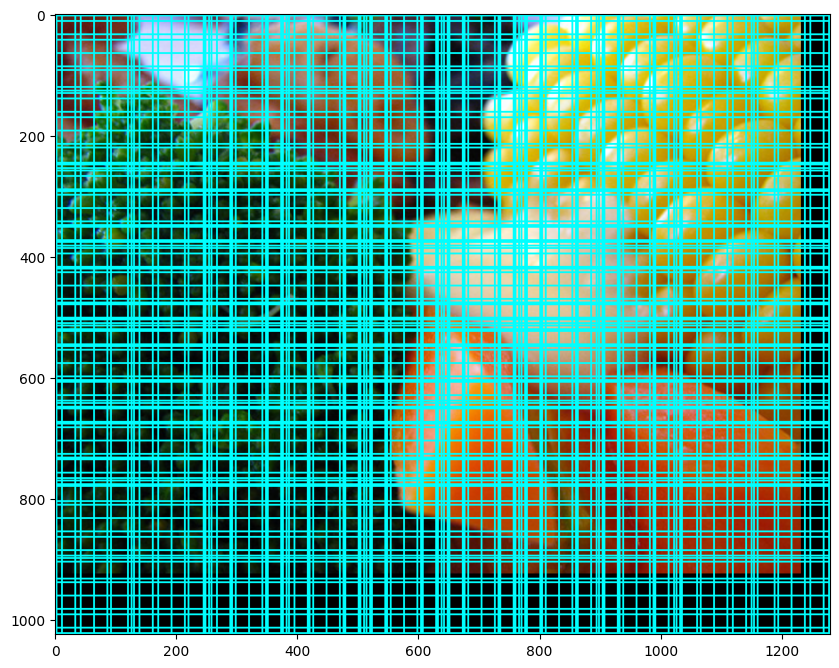

In [47]:
ix_start, ix_end = get_idx_level(img_t.shape[:2], level=5)
img = img_t.numpy()
img = show_bboxes(img, boxes[ix_start:ix_end].numpy(), color=(255, 255, 0))

plt.figure(figsize=(10, 10))
plt.imshow(img[...,::-1]);

En esta imagen podemos presenciar una especie de grillado generado por una serie de regiones posicionadas en sus respectivos pixeles. De esta forma se logra hacer un barrido por toda la imagen.

## Importancia de la metrica Intersection over Union (IoU)

<img src="https://drive.google.com/uc?export=view&id=1FFF96u89hEnlXSofYZk0rtd6JopligH9" width=400>

Un criterio que se puede emplear es comparar la similitud de los anchor boxes generados sobre cada pixel con los bounding boxes originales de la imagen, de esta forma podriamos seleccionar los anchor boxes que estan mas relacionados con el objeto de analisis de nuestra imagen.

Una forma de lograr esto consiste en utilizar la metrica de comparacion denominada Intersection over Union (IoU) o Jaccard Index el cual consiste en un cociente entre la interseccion y la union de dos areas cualesquiera, para nosotros, las areas de analisis seran un anchor box cualquiera y el bounding box de nuestro objeto. El rango de esta metrica se encuentra entre 0 y 1, siendo 0 la ausencia de superposicion entre ambas areas, mientras que 1 indica que ambos cuadros son iguales. Por lo tanto, aquellos cuadros con IoU cercanos a 1 seran de mucha utilidad para la localizacion de nuestro objeto.

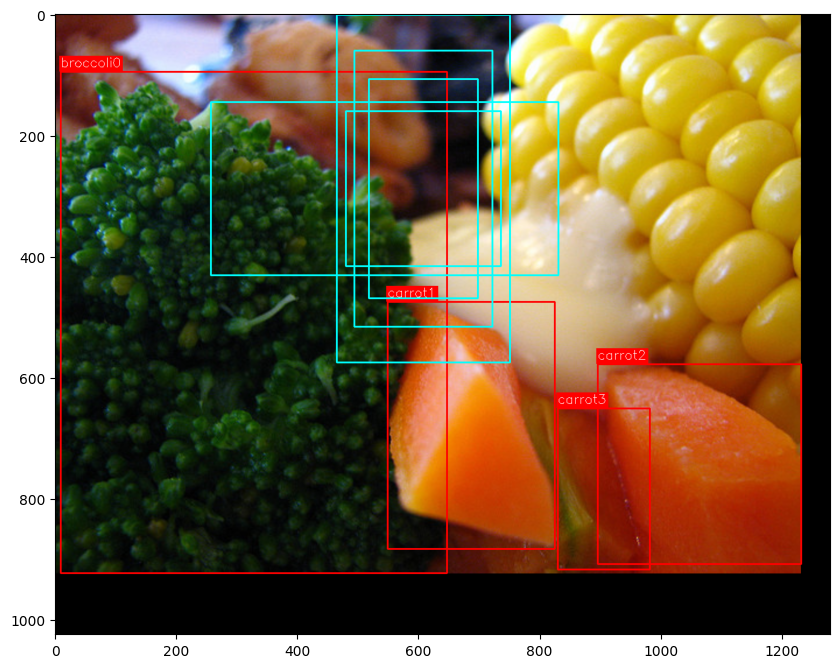

In [48]:
img_t = cv2.imread("/kaggle/input/coco-2017-dataset/coco2017/train2017/"+file.file_name)/255
img_t, bboxs = preprocess_data(img_t, file.bbox.copy())
boxes = multianchor_boxes(img_t.shape[0:2])
img = img_t.numpy()

i=0
for bbox, category_name in zip(bboxs, file.category_name):
    img = add_bbox(img, bbox.numpy(), category_name+str(i), fontScale=0.7, lw=2)
    i += 1
    
offset = 5*160
ix_start, ix_end = get_idx_level(img_t.shape[:2], level=4)

img = show_bboxes(img, boxes[ix_start+(offset):ix_start+(offset+5)].numpy(), color=(255, 255, 0));

plt.figure(figsize=(10, 10))
plt.imshow(img[...,::-1]);

En esta imagen podemos apreciar los cuadros delimitadores de nuestros objetos y un set de anchor boxes, podemos observar que algunos anchor boxes tienen mayores areas superpuestas sobre algunos objetos que otros anchor boxes, esto nos permitira seleccionar los anchor boxes mas utiles.

In [49]:
def iou(boxesA, boxesB):
    boxesA_ = bbox2corner(boxesA)
    boxesB_ = bbox2corner(boxesB)
    
    left_upper = tf.maximum(boxesA_[..., None, :2], boxesB_[..., :2])
    right_down = tf.minimum(boxesA_[..., None, 2:], boxesB_[..., 2:])
    
    intersection = tf.maximum(0.0, right_down - left_upper)
    intersection_area = intersection[:, :, 0] * intersection[:, :, 1]
    
    boxesA_area = (boxesA_[..., 2] - boxesA_[..., 0]) * (boxesA_[..., 3] - boxesA_[..., 1])
    boxesB_area = (boxesB_[..., 2] - boxesB_[..., 0]) * (boxesB_[..., 3] - boxesB_[..., 1])
    
    union_area = tf.maximum(boxesA_area[:, None] + boxesB_area - intersection_area, 1e-8)
    return tf.clip_by_value(intersection_area / union_area, 0.0, 1.0)

iou(tf.convert_to_tensor(bboxs), boxes[ix_start+offset:ix_start+offset+5]).numpy()

array([[0.19310886, 0.08625439, 0.11384351, 0.1452457 , 0.07790067],
       [0.        , 0.        , 0.03317437, 0.0781538 , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ]],
      dtype=float32)

Teniendo en cuenta que las filas representan la IoU de cada objeto para cada set de anchor boxes, podemos ver que no todas los anchor boxes se superponen con el bounding box del objeto. Estos ultimos, deberan ser descartados ya que nos proporcionan informacion util acerca de la posicion del objeto.

## Etiquetando los anchor boxes

Como ya vimos, no todos los anchor boxes son igual de utiles para la localizacion de nuestro objeto, entonces por medio de la metrica IoU filtraremos al conjunto de anchor boxes anteriormente generado y a su vez les asignaremos la categoria del objeto sobre la cual se encuentran posicionados.

In [50]:
def match_boxes(boxes, real_boxes, thresh=0.5, maximum_ignore=0.4):
    iou_result = iou(boxes, real_boxes)
    max_iou = tf.reduce_max(iou_result, axis=1)
    matched_idx = tf.argmax(iou_result, axis=1)
    positive_mask = tf.greater_equal(max_iou, thresh)
    negative_mask = tf.less(max_iou, maximum_ignore)
    ignore_mask = tf.logical_not(tf.logical_or(positive_mask, negative_mask))
    return (matched_idx, tf.cast(positive_mask, dtype=tf.float32), tf.cast(ignore_mask, dtype=tf.float32))

def boxes_target(boxes, matched_real_boxes):
    box_variance = tf.convert_to_tensor([0.1, 0.1, 0.2, 0.2], dtype=tf.float32)
    box_target = tf.concat(
        [
            (matched_real_boxes[..., :2] - boxes[..., :2]) / boxes[..., 2:],
            tf.math.log(matched_real_boxes[..., 2:] / boxes[..., 2:]),
        ],
        axis=-1,
    )
    box_target = box_target / box_variance
    return box_target

def classify_anchor_boxes(image_shape, real_boxes, class_ids, normalized=True):
    boxes = multianchor_boxes(image_shape)
    class_ids = tf.cast(class_ids, dtype=tf.float32)
    matched_idx, positive_mask, ignore_mask = match_boxes(boxes, real_boxes, thresh=0.5, maximum_ignore=0.4)
    
    matched_real_boxes = tf.gather(real_boxes, matched_idx)
    if normalized:
        box_target = boxes_target(boxes, matched_real_boxes)
    else:
        box_target = boxes
        
    matched_real_class_ids = tf.gather(class_ids, matched_idx)
    
    class_target = tf.where(tf.not_equal(positive_mask, 1.0), -1.0, matched_real_class_ids)
    class_target = tf.where(tf.equal(ignore_mask, 1.0), -2.0, class_target)
    class_target = tf.expand_dims(class_target, axis=-1)
    label = tf.concat([box_target, class_target], axis=-1)
    
    return label

x = classify_anchor_boxes(img_t.shape[0:2], tf.convert_to_tensor(bboxs), tf.convert_to_tensor(file.category_id), normalized = False)
y = tf.squeeze(tf.gather(x, tf.where(x[:, 4] >= 0 )))

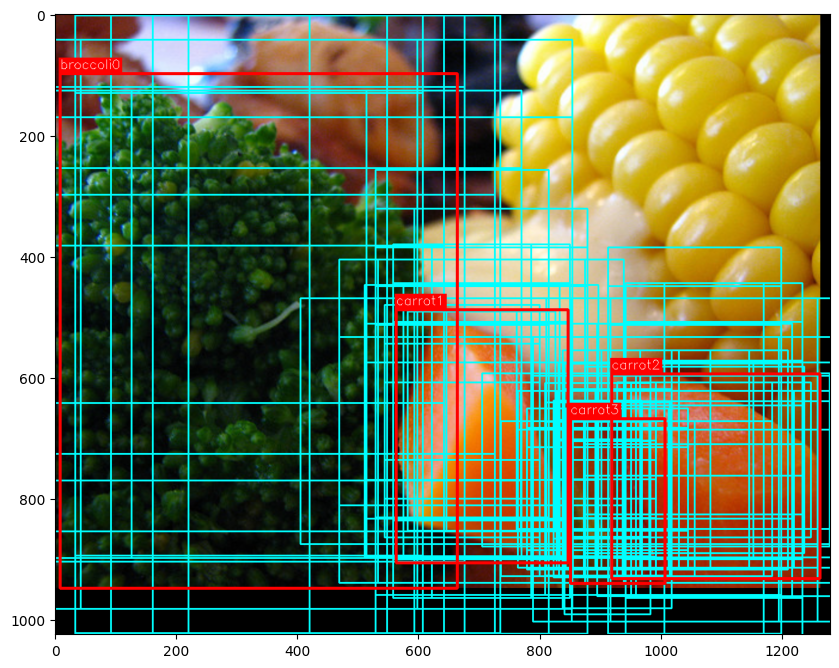

In [51]:
img_t = cv2.imread("/kaggle/input/coco-2017-dataset/coco2017/train2017/"+file.file_name)/255
img_t, bboxs = preprocess_data(img_t, file.bbox.copy())
img = img_t.numpy()

img = show_bboxes(img, y.numpy(), color=(255, 255, 0));

i=0
for bbox, category_name in zip(bboxs, file.category_name):
    img = add_bbox(img, bbox.numpy(), category_name+str(i), fontScale=0.7, lw=3)
    i += 1

plt.figure(figsize=(10, 10))
plt.imshow(img[...,::-1]);

## Creacion del set de datos

In [52]:
def gen(image_data, bbox, class_ids):
    image_data, bboxs = preprocess_data(image_data, bbox)
    return tf.cast(image_data, dtype="float32"), tf.cast(bboxs, dtype="float32"), tf.cast(class_ids, dtype="int32")

def myLabelEncoder(batch_images, bboxs, class_ids):
    images_shape = tf.shape(batch_images)
    batch_size = images_shape[0]

    labels = tf.TensorArray(dtype=tf.float32, size=batch_size, dynamic_size=True)
    
    for i in range(batch_size):
        label = classify_anchor_boxes(images_shape[1:3], bboxs[i], class_ids[i])
        labels = labels.write(i, label)
        
    batch_images_ = tf.keras.applications.resnet50.preprocess_input(batch_images)
    return batch_images_, labels.stack()

batch_size = 2
num_classes = 10

train_dataset_lc = train_dataset.map(gen, num_parallel_calls=autotune)
train_dataset_lc = train_dataset_lc.shuffle(8 * batch_size)
train_dataset_lc = train_dataset_lc.padded_batch(batch_size=batch_size, padding_values=(0.0, 1e-8, -1), drop_remainder=True, padded_shapes=([None, None, 3], [None, 4], [None]))
train_dataset_lc = train_dataset_lc.map(myLabelEncoder, num_parallel_calls=autotune)
train_dataset_lc = train_dataset_lc.prefetch(autotune)

val_dataset_lc = val_dataset.map(gen, num_parallel_calls=autotune)
val_dataset_lc = val_dataset_lc.padded_batch(batch_size=1, padding_values=(0.0, 1e-8, -1), drop_remainder=True, padded_shapes=([None, None, 3], [None, 4], [None]))
val_dataset_lc = val_dataset_lc.map(myLabelEncoder, num_parallel_calls=autotune)
val_dataset_lc = val_dataset_lc.prefetch(autotune)

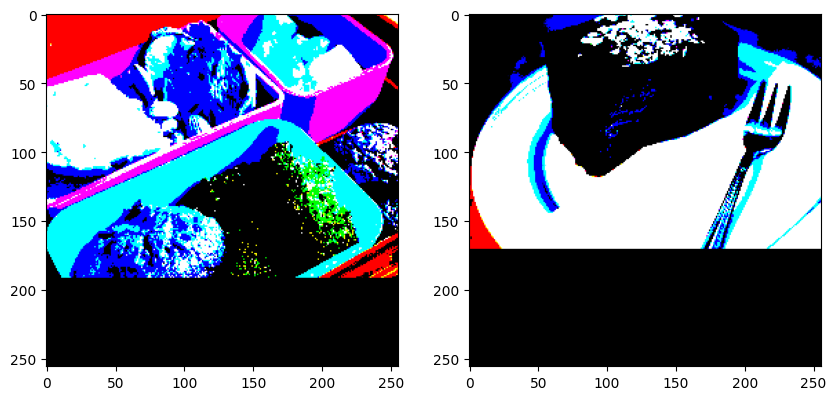

In [53]:
def get_category_name(id_):
    return train_cat.loc[train_cat.id == id_, "name"].values[0]

fig, axs = plt.subplots(1, 2, figsize=(10, 8))
for i, data in enumerate(train_dataset_loc.take(1).unbatch()):
    plt.subplot(1, 2, i+1)
    plt.imshow(data[0]);
    if i == 1:
        break

# Feature Pyramid Network (FPN)

[Paper "Feature Pyramid Networks for Object Detection"](https://arxiv.org/abs/1612.03144)

FPN es una red donde el flujo de datos consta de un camino ascendente, que reduce la resolucion espacial, y un camino descendente, que extrae características a través de una red convolucional habitual.

<img src="https://drive.google.com/uc?export=view&id=1CZL-XjF1getJ0Qw0fJk9ZCDH7DXfvbXX" width=400>

Un Single-Shot Detector (SSD) realiza la detección a partir de múltiples mapas de características de las capas superiores (pequeñas resoluciones), esto debido a que si se realizaran las detecciones en las capas inferiores (grandes resoluciones) se requerira de tiempos y velocidades computacionales importantes, por lo que al realizar las detecciones sobre resoluciones menores la deteccion de objetos pequeños empeora.

Por otro lado, las FPN a traves de este camino ascendente-descendente permite construir capas de mayor resolución a partir de una capa rica en semántica.

<img src="https://drive.google.com/uc?export=view&id=1B2FtsnZhflu93yv8USxLmsjGP89BRZLf" width=400>

Si bien las capas reconstruidas son semánticamente fuertes, las ubicaciones de los objetos no son precisas después de todo el muestreo. Agregamos conexiones laterales entre las capas reconstruidas y los mapas de características correspondientes para ayudar al detector a predecir mejor la ubicación.

<img src="https://drive.google.com/uc?export=view&id=1sxpFd9zhujY0IxEp6DoN7wyIB6_4fXT9" width=400>

El camino ascendente esta compuesto por el backbone ResNet50, el cual contiene 5 modulos convolucionales donde cada modulo nos permite reducir la dimension espacial a la mitad (se duplican los strides).

El camino descendente se puede formar apartir de un bucle de procesos, por ejemplo, apartir de C5 debemos aplicarle un filtro convolucional con un kernel size de 1x1 para obtener M5, aumentando la muestra de M5 por 2 usando el muestreo nearest neighbors ascendente, aplicando un filtro convolucional con kernel size de 1x1 a M4 y sumando estos resultados obtenemos M4, de igual manera podemos obtener M3 y M2.

Aplicamos una convolución de 3x3 a todas las capas fusionadas. Este filtro reduce el efecto de alias cuando se fusiona con la capa muestreada. De esta forma podemos obtener los niveles de escala P5, P4, P3 y P2.

Tengamos en cuenta que a medida que descendemos el procesamiento computacional comienza a tornarse costoso debido a que la dimension espacial vuelve a incrementarse, por esta razon a menudo nos podemos detener en P2 o antes.

In [54]:
backbone_lc = ResNet50(include_top=False, input_shape=(None, None, 3))

for layer in backbone_lc.layers:
    if "out" in layer.name:
        print(layer.name)

conv2_block1_out
conv2_block2_out
conv2_block3_out
conv3_block1_out
conv3_block2_out
conv3_block3_out
conv3_block4_out
conv4_block1_out
conv4_block2_out
conv4_block3_out
conv4_block4_out
conv4_block5_out
conv4_block6_out
conv5_block1_out
conv5_block2_out
conv5_block3_out


Podemos observar todas las salidas de los bloques convolucionales de la arquitectura ResNet50.

In [55]:
def get_backbone():
    backbone = keras.applications.ResNet50(include_top=False, input_shape=[None, None, 3])
    c3_output, c4_output, c5_output = [backbone.get_layer(layer_name).output for layer_name in ["conv3_block4_out", "conv4_block6_out", "conv5_block3_out"]]
    return keras.Model(inputs=[backbone.inputs], outputs=[c3_output, c4_output, c5_output])

## Arquitectura de la FPN

Acorde a la imagen de abajo, procederemos a construir la FPN.

<img src="https://drive.google.com/uc?export=view&id=1sxpFd9zhujY0IxEp6DoN7wyIB6_4fXT9" width=400>

In [56]:
class FeaturePyramidNetwork(keras.layers.Layer):
    def __init__(self, backbone, **kwargs):
        super().__init__(name="FeaturePyramidNetwork", **kwargs)
        self.backbone = backbone if backbone else get_backbone()
        
        self.upsample_2x = UpSampling2D(2) ## Incrementa el tamaño del mapa
        
        #self.conv_c2_1x1 = Conv2D(256, 1, 1, "same")
        self.conv_c3_1x1 = Conv2D(256, 1, 1, "same")
        self.conv_c4_1x1 = Conv2D(256, 1, 1, "same")
        self.conv_c5_1x1 = Conv2D(256, 1, 1, "same")
        
        #self.conv_M2_3x3 = Conv2D(256, 3, 1, "same")
        self.conv_M3_3x3 = Conv2D(256, 3, 1, "same")
        self.conv_M4_3x3 = Conv2D(256, 3, 1, "same")
        self.conv_M5_3x3 = Conv2D(256, 3, 1, "same")
        
        self.conv_c6_3x3 = Conv2D(256, 3, 2, "same")
        self.conv_c7_3x3 = Conv2D(256, 3, 2, "same")
        
    def call(self, images, training=False):
        c3_output, c4_output, c5_output = self.backbone(images, training=training)
        #Camino descendente

        ##### Este bloque reduce las dimensiones de los respectivos canales
        
        #c2_output_1x1 = self.conv_c2_1x1(c2_output)
        c3_output_1x1 = self.conv_c3_1x1(c3_output)
        c4_output_1x1 = self.conv_c4_1x1(c4_output)
        
        ####################################################################

        ##### Mergeo de los mapas upsampleados y los mapas reducidos dimensionalmente con una conv layer de kernel 1x1
        
        M5 = self.conv_c5_1x1(c5_output)
        M4 = c4_output_1x1 + self.upsample_2x(M5)
        M3 = c3_output_1x1 + self.upsample_2x(M4)
        #M2 = c2_output_1x1 + self.upsample_2x(M3)
        
        ##############################################################################################################

        ##### Este bloque reduce el efecto de aliasing producido por el upsampling, estos feature maps P tienen el mismo tamaño que las salidas C

        #Scale levels P
        #p2_output = self.conv_M2_3x3(M2)
        p3_output = self.conv_M3_3x3(M3)
        p4_output = self.conv_M4_3x3(M4)
        p5_output = self.conv_M4_3x3(M5)
        
        ########################################################################################################################################
        
        ### Salidas extras derivadas de C5, no contemplada en la imagen.
        p6_output = self.conv_c6_3x3(c5_output)
        p7_output = self.conv_c7_3x3(tf.nn.relu(p6_output))
        ###############################################################
        
        return p3_output, p4_output, p5_output, p6_output, p7_output

# FPN con Region Proposal Network (RPN)

[Paper "Faster R-CNN: Towards Real-Time Object Detection with Region Proposal Networks"](https://arxiv.org/abs/1506.01497)

FPN no es un detector de objetos en sí mismo. Es un extractor de funciones que funciona con detectores de objetos.

FPN extrae mapas de características y luego los introduce en un detector, conocido como RPN, para la detección de objetos. RPN aplica una ventana deslizante sobre los mapas de características para hacer la clasificacion de los cuadros y las ubicaciones de los cuadros limitadores de los objetos.

<img src="https://drive.google.com/uc?export=view&id=1-rUzx8EXtzXtEZHSywZVLdBp43ShNXc5" width=600>

Para cada nivel de escala se aplica un filtro de convolución de 3x3 sobre los mapas de características seguido de una convolución separada de 1x1 para la clasificacion y la regresión de los cuadros limitadores.

Estas capas convolucionales de 3x3 y 1x1 se denominan RPN heads. El mismo cabezal se aplica a todos los diferentes niveles de escala de mapas de características P.

<img src="https://drive.google.com/uc?export=view&id=1ZSDbTKYF-Ff1TiM-lc816RUTukWyKI-y" width=600>

## Arquitectura completa de la FPN con RPN

In [57]:
class MyNet(keras.Model):
    
    def __init__(self, num_classes, backbone, **kwargs):
        super().__init__(name="MyNet", **kwargs)
        self.num_classes = num_classes
        self.fpn = FeaturePyramidNetwork(backbone)
        
        prior_probability = tf.constant_initializer(-np.log((1 - 0.01) / 0.01))
        self.cls_head = self.RPNhead(9 * self.num_classes, prior_probability)
        self.box_head = self.RPNhead(9 * 4, "zeros")

    def RPNhead(self, output_filters, bias_init):
        kernel_init = tf.initializers.RandomNormal(0.0, 0.01)
        head = keras.Sequential([Input(shape=[None, None, 256])])
        for _ in range(4):
            head.add(keras.layers.Conv2D(256, 3, padding="same", kernel_initializer=kernel_init))
            head.add(keras.layers.ReLU())
        head.add(keras.layers.Conv2D(output_filters, 3, 1, padding="same", bias_initializer=bias_init, kernel_initializer=kernel_init))
        return head
    
    def call(self, image, training=False):
        features = self.fpn(image, training=training)
        
        cls_outputs = []
        box_outputs = []
        
        N = tf.shape(image)[0]

        for p_output in features:
            box_outputs.append(tf.reshape(self.box_head(p_output), [N, -1, 4]))
            cls_outputs.append(tf.reshape(self.cls_head(p_output), [N, -1, self.num_classes]))

        cls_outputs = tf.concat(cls_outputs, axis=1)
        box_outputs = tf.concat(box_outputs, axis=1)
        
        return tf.concat([box_outputs, cls_outputs], axis=-1)

backbone = get_backbone()
model_lc = MyNet(num_classes, backbone)

/opt/conda/lib/python3.10/site-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer RandomNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


## Funciones de perdida

- [Understanding L1 and SmoothL1Loss](https://medium.com/mlearning-ai/understanding-l1-and-smoothl1loss-f5af0f801c71)
- [Understanding Focal Loss](https://medium.com/visionwizard/understanding-focal-loss-a-quick-read-b914422913e7)
- [Understanding Categorical Cross-Entropy Loss, Binary Cross-Entropy Loss, Softmax Loss, Logistic Loss, Focal Loss and all those confusing names](https://gombru.github.io/2018/05/23/cross_entropy_loss/)


In [58]:
class BoxSmoothL1loss(tf.losses.Loss):

    def __init__(self, beta):
        super().__init__(reduction="none")
        self.beta = beta

    def call(self, y_true, y_pred):
        diff = y_true - y_pred
        abs_diff = tf.abs(diff)
        sqrt_diff = diff ** 2
        loss = tf.where(tf.less(abs_diff, self.beta), sqrt_diff/2, abs_diff - self.beta/2)
        return tf.reduce_sum(loss, axis=-1)

class ClassificationFocalLoss(tf.losses.Loss):
    
    def __init__(self, alpha, gamma):
        super().__init__(reduction="none")
        self.alpha = alpha
        self.gamma = gamma

    def call(self, y_true, y_pred):
        cross_entropy = tf.nn.sigmoid_cross_entropy_with_logits(labels=y_true, logits=y_pred)
        probs = tf.nn.sigmoid(y_pred)
        alpha = tf.where(tf.equal(y_true, 1.0), self.alpha, (1.0 - self.alpha))
        pt = tf.where(tf.equal(y_true, 1.0), probs, 1 - probs)
        loss = alpha * tf.pow(1.0 - pt, self.gamma) * cross_entropy
        return tf.reduce_sum(loss, axis=-1)

class myLoss(tf.losses.Loss):
    """Wrapper para combinar ambas funciones de perdida"""

    def __init__(self, num_classes=10, alpha=0.25, gamma=2.0, beta=1.0):
        super().__init__(reduction="auto", name="myLoss")
        self.clf_loss = ClassificationFocalLoss(alpha, gamma)
        self.box_loss = BoxSmoothL1loss(beta)
        self.num_classes = num_classes

    def call(self, y_true, y_pred):
        y_pred = tf.cast(y_pred, dtype=tf.float32)
        box_labels = y_true[:, :, :4]
        box_predictions = y_pred[:, :, :4]
        cls_labels = tf.one_hot(
            tf.cast(y_true[:, :, 4], dtype=tf.int32),
            depth=self.num_classes,
            dtype=tf.float32,
        )
        cls_predictions = y_pred[:, :, 4:]
        positive_mask = tf.cast(tf.greater(y_true[:, :, 4], -1.0), dtype=tf.float32)
        ignore_mask = tf.cast(tf.equal(y_true[:, :, 4], -2.0), dtype=tf.float32)
        clf_loss = self.clf_loss(cls_labels, cls_predictions)
        box_loss = self.box_loss(box_labels, box_predictions)
        clf_loss = tf.where(tf.equal(ignore_mask, 1.0), 0.0, clf_loss)
        box_loss = tf.where(tf.equal(positive_mask, 1.0), box_loss, 0.0)
        normalizer = tf.reduce_sum(positive_mask, axis=-1)
        clf_loss = tf.math.divide_no_nan(tf.reduce_sum(clf_loss, axis=-1), normalizer)
        box_loss = tf.math.divide_no_nan(tf.reduce_sum(box_loss, axis=-1), normalizer)
        loss = clf_loss + box_loss
        return loss
    
loss_fn = myLoss(num_classes)

## Learning Rate Decay

- [Learning Rate Schedules and Decay in Keras Optimizers](https://medium.com/data-science-365/learning-rate-schedules-and-decay-in-keras-optimizers-f68bf91de57d)
- [Learning Rate Decay and methods in Deep Learning](https://medium.com/analytics-vidhya/learning-rate-decay-and-methods-in-deep-learning-2cee564f910b)



In [59]:
learning_rates = [2.5e-06, 0.000625, 0.00125, 0.00025, 0.000125, 2.5e-05]
learning_rate_boundaries = [125, 250, 500, 240000, 360000]
learning_rate_fn = tf.optimizers.schedules.PiecewiseConstantDecay(
    boundaries=learning_rate_boundaries, values=learning_rates
)

optimizer = tf.keras.optimizers.legacy.SGD(learning_rate=learning_rate_fn, momentum=0.9)

## Entrenamiento del modelo

In [60]:
model_lc.compile(loss=loss_fn, optimizer=optimizer, metrics=["accuracy"])

#train_steps_per_epoch = len(train_target) // batch_size
#val_steps_per_epoch = len(val_target) // batch_size

epochs = 10

history_lc = model_lc.fit(
    train_dataset_lc.take(100),
    validation_data=val_dataset_lc.take(100),
    epochs=epochs,
    verbose = 1
)

Epoch 1/10
100/100 [==============================] - 203s 2s/step - loss: 2.8289 - accuracy: 0.2259 - val_loss: 2.7975 - val_accuracy: 0.2253
Epoch 2/10
100/100 [==============================] - 58s 582ms/step - loss: 2.8489 - accuracy: 0.2430 - val_loss: 2.7342 - val_accuracy: 0.2554
Epoch 3/10
100/100 [==============================] - 55s 545ms/step - loss: 2.7407 - accuracy: 0.2814 - val_loss: 2.6401 - val_accuracy: 0.2128
Epoch 4/10
100/100 [==============================] - 54s 527ms/step - loss: 2.6084 - accuracy: 0.2783 - val_loss: 2.6136 - val_accuracy: 0.2654
Epoch 5/10
100/100 [==============================] - 57s 570ms/step - loss: 2.4685 - accuracy: 0.2741 - val_loss: 2.4251 - val_accuracy: 0.2539
Epoch 6/10
100/100 [==============================] - 51s 508ms/step - loss: 2.2749 - accuracy: 0.2896 - val_loss: 2.3072 - val_accuracy: 0.2715
Epoch 7/10
100/100 [==============================] - 52s 513ms/step - loss: 2.0261 - accuracy: 0.2913 - val_loss: 2.1296 - val_accu

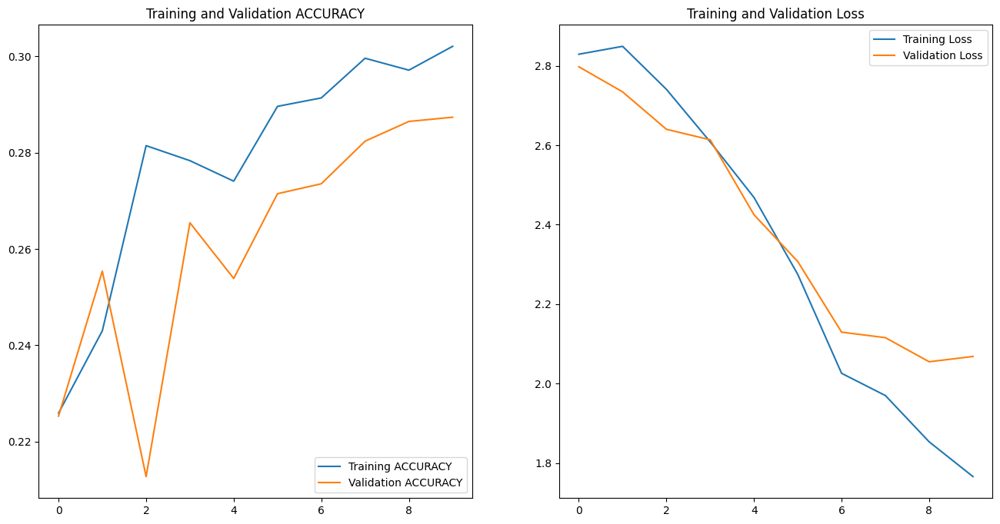

In [61]:
plot_history(history_lc, epochs)

In [62]:
class DecodePredictions(tf.keras.layers.Layer):
    def __init__(
        self,
        num_classes=10,
        confidence_threshold=0.05,
        nms_iou_threshold=0.5,
        max_detections_per_class=10,
        max_detections=10,
        box_variance=[0.1, 0.1, 0.2, 0.2],
        **kwargs
    ):
        super().__init__(**kwargs)
        self.num_classes = num_classes
        self.confidence_threshold = confidence_threshold
        self.nms_iou_threshold = nms_iou_threshold
        self.max_detections_per_class = max_detections_per_class
        self.max_detections = max_detections
        
        self._box_variance = tf.convert_to_tensor([0.1, 0.1, 0.2, 0.2], dtype=tf.float32)

    def decode_box_predictions(self, anchor_boxes, box_predictions):
        boxes = box_predictions * self._box_variance
        boxes = tf.concat(
            [
                tf.math.multiply(boxes[..., :2], anchor_boxes[..., 2:]) + anchor_boxes[..., :2],
                tf.math.multiply(tf.math.exp(boxes[..., 2:]), anchor_boxes[..., 2:]),
            ],
            axis=-1,
        )
        boxes_transformed = bbox2corner(boxes)
        return boxes_transformed

    def call(self, images, predictions):
        image_shape = tf.cast(tf.shape(images), dtype=tf.float32)
        anchor_boxes = multianchor_boxes(image_shape[1:3])
        box_predictions = predictions[..., :4]
        cls_predictions = tf.nn.sigmoid(predictions[..., 4:])
        boxes = self.decode_box_predictions(anchor_boxes[None, ...], box_predictions)
        
        return tf.image.combined_non_max_suppression(
            boxes=tf.expand_dims(boxes, axis=2),
            scores=cls_predictions,
            max_output_size_per_class=self.max_detections_per_class,
            max_total_size=self.max_detections,
            iou_threshold=self.nms_iou_threshold,
            score_threshold=self.confidence_threshold,
            clip_boxes=False,
        )
    
image = tf.keras.Input(shape=[None, None, 3], name="image")
predictions = model_lc(image, training=False)
detections = DecodePredictions(confidence_threshold=0.01)(image, predictions)
inference_model = tf.keras.Model(inputs=image, outputs=detections)

1/1 [==============================] - 2s 2s/step


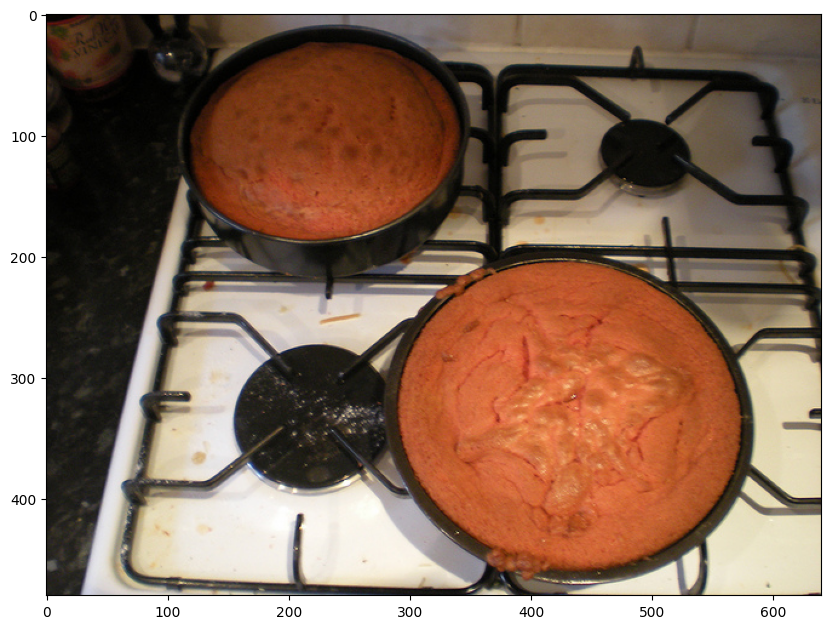

In [63]:
def preprocess_image(image_data, resnet_preprocess=False):
    image_data, _, ratio = resize(image_data, bboxs, jitter=None)
    image_data = padding_zero(image_data)
    if resnet_preprocess:
         image_data = tf.keras.applications.resnet.preprocess_input(image_data)
    return  tf.expand_dims(image_data, axis=0), ratio

file = val_target.iloc[130]
listfiles_test = os.listdir("/kaggle/input/coco-2017-dataset/coco2017/val2017")
pathfile = "/kaggle/input/coco-2017-dataset/coco2017/val2017/"+file.file_name
img = tf.convert_to_tensor(cv2.imread(pathfile))
img_pr, ratio = preprocess_image(img, resnet_preprocess=True)
prediction = inference_model.predict(img_pr)
plt.figure(figsize=(10, 10))
plt.imshow(img[...,::-1]);

In [64]:
prediction, file.category_id

(CombinedNonMaxSuppression(nmsed_boxes=array([[[ 273.62125 ,  113.557846,  449.085   ,  396.5028  ],
         [ 675.1374  ,  194.75714 , 1016.03827 ,  385.76184 ],
         [ 372.69702 ,  376.24487 ,  919.2634  ,  762.021   ],
         [ 100.574356,  466.32166 ,  370.1648  ,  730.9348  ],
         [ 684.981   ,  147.34303 ,  890.60175 ,  384.15027 ],
         [ 163.29257 ,  445.61273 ,  604.0974  ,  668.02814 ],
         [ 716.20764 ,  128.08987 ,  963.45544 ,  321.42416 ],
         [ 378.11026 ,  172.9259  ,  484.04245 ,  332.65936 ],
         [ 273.62125 ,  113.557846,  449.085   ,  396.5028  ],
         [ 242.6319  ,  221.91095 ,  378.51044 ,  347.67426 ]]],
       dtype=float32), nmsed_scores=array([[0.01351752, 0.01348325, 0.01338856, 0.01334951, 0.01331194,
         0.01321472, 0.01321283, 0.01315987, 0.01314729, 0.01312966]],
       dtype=float32), nmsed_classes=array([[3., 1., 6., 9., 2., 8., 0., 4., 2., 2.]], dtype=float32), valid_detections=array([10], dtype=int32)),
 array([

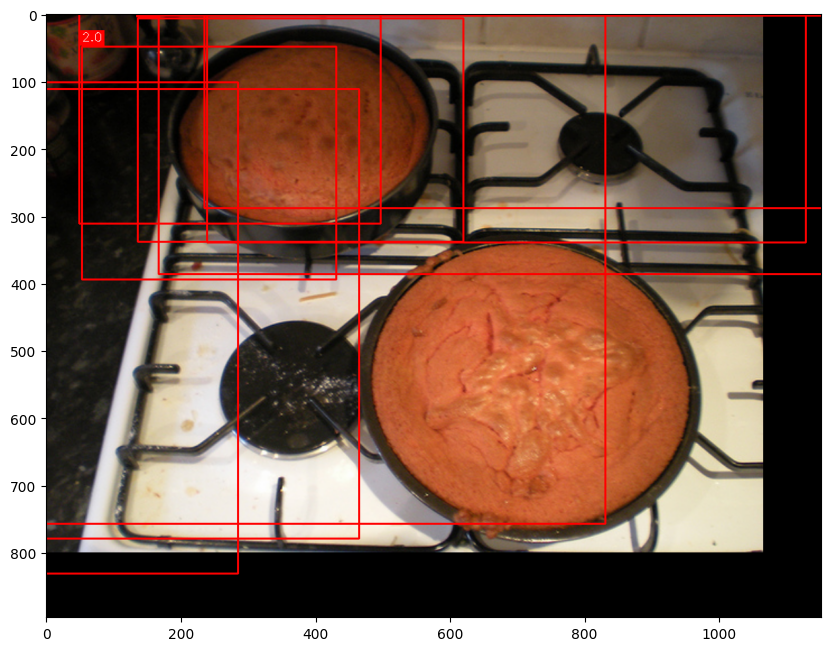

In [65]:
image_pr, ratio = preprocess_image(img, resnet_preprocess=False)
img_npy = image_pr[0].numpy().astype("int32")

num_detections = prediction.valid_detections[0]
nmsed_boxes, nmsed_scores, nmsed_classes = prediction.nmsed_boxes[0], prediction.nmsed_scores[0], prediction.nmsed_classes[0]

for bbox, category_id in zip(nmsed_boxes[:num_detections], nmsed_classes[:num_detections]):
    img_npy = add_bbox(img_npy, bbox, str(category_id), lw=2)
    
plt.figure(figsize=(10, 10))
plt.imshow(img_npy[...,::-1])